## ChIP-seq Analysis: STAT1 Binding in K562 Cells

- This notebook contains a **ChIP-seq analysis pipeline** for identifying STAT1 binding sites in the K562 human leukemia cell line treated with Interferon-alpha (IFNα).  
- The study is based on ENCODE ChIP-seq data from **GEO dataset GSE31477**.  
- The workflow includes **quality control, read alignment, peak calling, differential peak analysis, motif enrichment, and functional annotation.**



### Dataset Information
- **Project:** NCBI SRA project GSE31477  
- **Samples:**
  - **SRR502225** (K562 Input Control - IFNα 6h)
  - **SRR502228** (K562 Input Control - IFNα 30h)
  - **SRR502327** (K562 STAT1 ChIP - IFNα 6h)
  - **SRR502329** (K562 STAT1 ChIP - IFNα 30h)
- **Reference Genome:** GRCh38


### Workflow Overview
This notebook follows a standard ChIP-seq analysis workflow:
1. **Quality Control** – FastQC, Cutadapt
2. **Read Alignment** – Bowtie2, Samtools
3. **Remove Duplicates** – Picard
4. **Peak Calling** – MACS2
5. **Differential Peak Analysis** – bedtools
6. **Motif Analysis** – HOMER
7. **Functional Annotation** – Gene Ontology (GO) and KEGG Enrichment
8. **Transcription Factor Enrichment** – HOMER, ChEA3
9. **Validation & Network Analysis**


In [1]:
# Import necessary libraries
from Bio import SeqIO
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import os
import subprocess

In [3]:

# Define directories
base_dir = "/home/abhi39/Projects/CHIPseq"
data_dir = os.path.join(base_dir, "data")
reads_dir = os.path.join(data_dir, "reads")
chr_bed_dir = os.path.join(data_dir, "chr_bed")
os.makedirs(data_dir, exist_ok=True)
os.makedirs(reads_dir, exist_ok=True)
os.makedirs(chr_bed_dir, exist_ok=True)


reference_dir = os.path.join(base_dir, "genome")
genome_dir = os.path.join(reference_dir, "genome")
annotation_dir = os.path.join(reference_dir, "annotation")
index_dir = os.path.join(genome_dir, "bwa_index")
os.makedirs(reference_dir, exist_ok=True)
os.makedirs(genome_dir, exist_ok=True)
os.makedirs(annotation_dir, exist_ok=True)
os.makedirs(index_dir, exist_ok=True)

output_dir = os.path.join(base_dir, "output")
alignment_dir = os.path.join(output_dir, "3_alignment")
macs_dir = os.path.join(output_dir, "4_peak_calling")
macs_output_dir = os.path.join(macs_dir, "output")
qc_dir = os.path.join(output_dir, "1_qc_results")
fqc_results_dir = os.path.join(qc_dir, "fqc_results") 
qc_trim_dir = os.path.join(output_dir, "2_trimmed_reads")
trim_dir = os.path.join(qc_dir, "trim")
dedup_bam_dir = os.path.join(alignment_dir, "deduplicated_bam")

os.makedirs(output_dir, exist_ok = True)
os.makedirs(alignment_dir, exist_ok = True)
os.makedirs(macs_dir, exist_ok = True)
os.makedirs(macs_output_dir, exist_ok = True)
os.makedirs(qc_dir, exist_ok = True)
os.makedirs(fqc_results_dir, exist_ok = True)
os.makedirs(qc_trim_dir, exist_ok = True)
os.makedirs(trim_dir, exist_ok = True)
os.makedirs(dedup_bam_dir, exist_ok = True)


adapter_dir = os.path.join(base_dir, "adapters")
os.makedirs(adapter_dir, exist_ok=True)


macs_dir = os.path.join(output_dir, "4_peak_calling")
macs_output_dir = os.path.join(macs_dir, "output")
macs_output2_dir = os.path.join(macs_dir, "output2")
os.makedirs(macs_dir, exist_ok=True)
os.makedirs(macs_output_dir, exist_ok=True)
os.makedirs(macs_output2_dir, exist_ok=True)

peak_stats_dir = os.path.join(output_dir, "6_peak_statistics")
os.makedirs(peak_stats_dir, exist_ok = True)

motif_dir = os.path.join(output_dir, "7_motif_analysis")
os.makedirs(motif_dir, exist_ok=True)

qc_dir = os.path.join(output_dir, "1_qc_results")
fqc_results_dir = os.path.join(qc_dir, "fqc_results") 
qc_trim_dir = os.path.join(output_dir, "2_trimmed_reads")
trim_dir = os.path.join(qc_dir, "trim")
os.makedirs(qc_dir, exist_ok=True)
os.makedirs(fqc_results_dir, exist_ok=True)
os.makedirs(qc_trim_dir, exist_ok=True)
os.makedirs(trim_dir, exist_ok=True)

visualization_dir = os.path.join(output_dir, "5_visualization")
bigwig_dir = os.path.join(visualization_dir, "bigwig")
figures_dir = os.path.join(visualization_dir, "figures")
matrix_dir = os.path.join(visualization_dir, "matrix")
os.makedirs(visualization_dir, exist_ok=True)
os.makedirs(bigwig_dir, exist_ok=True)
os.makedirs(figures_dir, exist_ok=True)
os.makedirs(matrix_dir, exist_ok=True)

########################
ref_index_dir = os.path.join(base_dir, "reference_index")
aligned_reads_dir = os.path.join(base_dir, "aligned_reads")
results_dir = os.path.join(base_dir, "results")
data_dir = os.path.join(base_dir, "data")
os.makedirs(ref_index_dir, exist_ok=True)
os.makedirs(aligned_reads_dir, exist_ok=True)
os.makedirs(results_dir, exist_ok=True)
os.makedirs(data_dir, exist_ok=True)

idr_dir = os.path.join(base_dir, "idr")
os.makedirs(idr_dir, exist_ok=True)

chipseq_r_dir = os.path.join(base_dir, "chipseq_r")
chipseq_bam_dir = os.path.join(chipseq_r_dir, "bam")
chipseq_peaks_dir = os.path.join(chipseq_r_dir, "peaks")
chipseq_consensus_peaks_dir = os.path.join(chipseq_r_dir, "consensus_peaks")
os.makedirs(chipseq_r_dir, exist_ok=True)
os.makedirs(chipseq_bam_dir, exist_ok=True)
os.makedirs(chipseq_peaks_dir, exist_ok=True)
os.makedirs(chipseq_consensus_peaks_dir, exist_ok=True)

bedtools_dir = os.path.join(base_dir, "bedtools")
os.makedirs(bedtools_dir, exist_ok=True)


#### Step 1: Download required files

##### Step 1.1: Download genome and annotation file

In [7]:
import os
import subprocess

# URLs for the files
urls = {
    "genome": "https://ftp.ebi.ac.uk/pub/databases/gencode/Gencode_human/release_38/GRCh38.primary_assembly.genome.fa.gz",
    "annotation": "https://ftp.ebi.ac.uk/pub/databases/gencode/Gencode_human/release_38/gencode.v38.annotation.gtf.gz",
}

# File paths
output_files = {
    "genome": os.path.join(genome_dir, "GRCh38.primary_assembly.genome.fa.gz"),
    "annotation": os.path.join(annotation_dir, "gencode.v38.annotation.gtf.gz"),
}

# Function to download and decompress files using wget and gunzip
def download_and_decompress_wget(url, output_path):
    # Download file using wget
    try:
        print(f"Downloading {output_path}...")
        subprocess.run(["wget", "-q", "-O", output_path, url], check=True)
        print(f"Downloaded: {output_path}")
    except subprocess.CalledProcessError as e:
        print(f"Failed to download {output_path}. Error: {e}")
        return

    # Decompress file using gunzip
    try:
        print(f"Decompressing {output_path}...")
        subprocess.run(["gunzip", "-f", output_path], check=True)
        print(f"Decompressed to: {output_path[:-3]}")
    except subprocess.CalledProcessError as e:
        print(f"Failed to decompress {output_path}. Error: {e}")

# Download and decompress files
for file_type, url in urls.items():
    download_and_decompress_wget(url, output_files[file_type])

print("All files downloaded and decompressed successfully!")

Downloaded: /home/abhi39/Projects/CHIPseq/genome/genome/GRCh38.primary_assembly.genome.fa.gz
Decompressing /home/abhi39/Projects/CHIPseq/genome/genome/GRCh38.primary_assembly.genome.fa.gz...
Decompressed to: /home/abhi39/Projects/CHIPseq/genome/genome/GRCh38.primary_assembly.genome.fa
Downloaded: /home/abhi39/Projects/CHIPseq/genome/annotation/gencode.v38.annotation.gtf.gz
Decompressing /home/abhi39/Projects/CHIPseq/genome/annotation/gencode.v38.annotation.gtf.gz...
Decompressed to: /home/abhi39/Projects/CHIPseq/genome/annotation/gencode.v38.annotation.gtf
All files downloaded and decompressed successfully!


##### Step 1.2: Download fastq files of CHIPseq data

In [8]:
# Step 1.2 Download fastq files 
import os
import subprocess

os.makedirs(reads_dir, exist_ok = True)

# Download FASTQ files using SRA Toolkit
def download_fastq(srr_id, reads_dir):
    print(f"Downloading FASTQ files for {srr_id}...")
    
    # Use prefetch to download the SRA file
    subprocess.run(["prefetch", srr_id], check=True)
    
    # Use fasterq-dump to extract FASTQ files to the specified directory
    subprocess.run([
        "fasterq-dump", "--outdir", reads_dir, srr_id
    ], check=True)
    
    # Compress the resulting FASTQ files
    for fq_file in os.listdir(reads_dir):
        if fq_file.startswith(srr_id) and fq_file.endswith(".fastq"):
            fq_path = os.path.join(reads_dir, fq_file)
            subprocess.run(["gzip", fq_path], check=True)
            print(f"Compressed: {fq_path}.gz")
    print(f"Downloaded and saved FASTQ files for {srr_id} to {reads_dir}")

# List of SRR IDs
srr_ids = ["SRR502225", # Yale_ChipSeq_K562_IFNa6h_Input_std
           "SRR502228", # Yale_ChipSeq_K562_IFNa30_Input_std
           "SRR502327", # Yale_ChipSeq_K562_IFNa6h_STAT1_std
           "SRR502329"] # Yale_ChipSeq_K562_IFNa30_STAT1_std

# Download each SRR ID
for srr_id in srr_ids:
    download_fastq(srr_id, reads_dir)

print(f"All FASTQ files are saved in: {reads_dir}")

2025-01-30T21:52:33 prefetch.3.1.1: 1) Resolving 'SRR502225'...
2025-01-30T21:52:35 prefetch.3.1.1: Current preference is set to retrieve SRA Normalized Format files with full base quality scores
2025-01-30T21:52:35 prefetch.3.1.1: 1) Downloading 'SRR502225'...
2025-01-30T21:52:35 prefetch.3.1.1:  SRA Normalized Format file is being retrieved
2025-01-30T21:52:35 prefetch.3.1.1:  Downloading via HTTPS...
2025-01-30T21:53:20 prefetch.3.1.1:  HTTPS download succeed
2025-01-30T21:53:23 prefetch.3.1.1:  'SRR502225' is valid: 731846866 bytes were streamed from 731840045
2025-01-30T21:53:23 prefetch.3.1.1: 1) 'SRR502225' was downloaded successfully


spots read      : 31,983,231
reads read      : 31,983,231
reads written   : 31,983,231


Compressed: /home/abhi39/Projects/CHIPseq/data/reads/SRR502225.fastq.gz
Downloaded and saved FASTQ files for SRR502225 to /home/abhi39/Projects/CHIPseq/data/reads
2025-01-30T21:56:17 prefetch.3.1.1: 1) Resolving 'SRR502228'...
2025-01-30T21:56:19 prefetch.3.1.1: Current preference is set to retrieve SRA Normalized Format files with full base quality scores
2025-01-30T21:56:19 prefetch.3.1.1: 1) Downloading 'SRR502228'...
2025-01-30T21:56:19 prefetch.3.1.1:  SRA Normalized Format file is being retrieved
2025-01-30T21:56:19 prefetch.3.1.1:  Downloading via HTTPS...
2025-01-30T21:57:07 prefetch.3.1.1:  HTTPS download succeed
2025-01-30T21:57:09 prefetch.3.1.1:  'SRR502228' is valid: 611764032 bytes were streamed from 611758617
2025-01-30T21:57:09 prefetch.3.1.1: 1) 'SRR502228' was downloaded successfully


spots read      : 26,699,669
reads read      : 26,699,669
reads written   : 26,699,669


Compressed: /home/abhi39/Projects/CHIPseq/data/reads/SRR502228.fastq.gz
Downloaded and saved FASTQ files for SRR502228 to /home/abhi39/Projects/CHIPseq/data/reads
2025-01-30T21:59:37 prefetch.3.1.1: 1) Resolving 'SRR502327'...
2025-01-30T21:59:39 prefetch.3.1.1: Current preference is set to retrieve SRA Normalized Format files with full base quality scores
2025-01-30T21:59:39 prefetch.3.1.1: 1) Downloading 'SRR502327'...
2025-01-30T21:59:39 prefetch.3.1.1:  SRA Normalized Format file is being retrieved
2025-01-30T21:59:39 prefetch.3.1.1:  Downloading via HTTPS...
2025-01-30T22:00:12 prefetch.3.1.1:  HTTPS download succeed
2025-01-30T22:00:14 prefetch.3.1.1:  'SRR502327' is valid: 409396073 bytes were streamed from 409384473
2025-01-30T22:00:14 prefetch.3.1.1: 1) 'SRR502327' was downloaded successfully


spots read      : 19,429,794
reads read      : 19,429,794
reads written   : 19,429,794


Compressed: /home/abhi39/Projects/CHIPseq/data/reads/SRR502327.fastq.gz
Downloaded and saved FASTQ files for SRR502327 to /home/abhi39/Projects/CHIPseq/data/reads
2025-01-30T22:01:46 prefetch.3.1.1: 1) Resolving 'SRR502329'...
2025-01-30T22:01:47 prefetch.3.1.1: Current preference is set to retrieve SRA Normalized Format files with full base quality scores
2025-01-30T22:01:48 prefetch.3.1.1: 1) Downloading 'SRR502329'...
2025-01-30T22:01:48 prefetch.3.1.1:  SRA Normalized Format file is being retrieved
2025-01-30T22:01:48 prefetch.3.1.1:  Downloading via HTTPS...
2025-01-30T22:02:25 prefetch.3.1.1:  HTTPS download succeed
2025-01-30T22:02:27 prefetch.3.1.1:  'SRR502329' is valid: 439913577 bytes were streamed from 439901721
2025-01-30T22:02:27 prefetch.3.1.1: 1) 'SRR502329' was downloaded successfully


spots read      : 21,192,112
reads read      : 21,192,112
reads written   : 21,192,112


Compressed: /home/abhi39/Projects/CHIPseq/data/reads/SRR502329.fastq.gz
Downloaded and saved FASTQ files for SRR502329 to /home/abhi39/Projects/CHIPseq/data/reads
All FASTQ files are saved in: /home/abhi39/Projects/CHIPseq/data/reads


##### Step 2: Perform quality control using fastQC and trim reads using trimmomatic
##### Step 2.1. Run FastQC for initial quality check

In [4]:
fqc_results_dir = os.path.join(qc_dir, "fqc_results")
os.makedirs(fqc_results_dir, exist_ok = True)

def run_fastqc(fastq_file, fqc_results_dir):
    """Run quality control using FastQC"""
    print(f"Running quality control using FastQC...")
    subprocess.run(["fastqc", fastq_file, "--outdir", fqc_results_dir], check = True)
    print(f"FastQC comnplete for {fastq_file}. Reports saved in {fqc_results_dir}")

# Define input FASTQ files for each sample (single-end)
samples = {
    "SRR502225": os.path.join(reads_dir, "SRR502225.fastq.gz"),
    "SRR502228": os.path.join(reads_dir, "SRR502228.fastq.gz"),
    "SRR502327": os.path.join(reads_dir, "SRR502327.fastq.gz"), 
    "SRR502329": os.path.join(reads_dir, "SRR502329.fastq.gz"), 
}

# Run FastQC for all samples
for sample, fastq in samples.items():
    run_fastqc(fastq, fqc_results_dir)
    
print("Quality control complete. Review FastQC reports before proceeding to trimming.")

Running quality control using FastQC...
application/gzip


Started analysis of SRR502225.fastq.gz
Approx 5% complete for SRR502225.fastq.gz
Approx 10% complete for SRR502225.fastq.gz
Approx 15% complete for SRR502225.fastq.gz
Approx 20% complete for SRR502225.fastq.gz
Approx 25% complete for SRR502225.fastq.gz
Approx 30% complete for SRR502225.fastq.gz
Approx 35% complete for SRR502225.fastq.gz
Approx 40% complete for SRR502225.fastq.gz
Approx 45% complete for SRR502225.fastq.gz
Approx 50% complete for SRR502225.fastq.gz
Approx 55% complete for SRR502225.fastq.gz
Approx 60% complete for SRR502225.fastq.gz
Approx 65% complete for SRR502225.fastq.gz
Approx 70% complete for SRR502225.fastq.gz
Approx 75% complete for SRR502225.fastq.gz
Approx 80% complete for SRR502225.fastq.gz
Approx 85% complete for SRR502225.fastq.gz
Approx 90% complete for SRR502225.fastq.gz
Approx 95% complete for SRR502225.fastq.gz


Analysis complete for SRR502225.fastq.gz
FastQC comnplete for /home/abhi39/Projects/CHIPseq/data/reads/SRR502225.fastq.gz. Reports saved in /home/abhi39/Projects/CHIPseq/output/1_qc_results/fqc_results
Running quality control using FastQC...
application/gzip


Started analysis of SRR502228.fastq.gz
Approx 5% complete for SRR502228.fastq.gz
Approx 10% complete for SRR502228.fastq.gz
Approx 15% complete for SRR502228.fastq.gz
Approx 20% complete for SRR502228.fastq.gz
Approx 25% complete for SRR502228.fastq.gz
Approx 30% complete for SRR502228.fastq.gz
Approx 35% complete for SRR502228.fastq.gz
Approx 40% complete for SRR502228.fastq.gz
Approx 45% complete for SRR502228.fastq.gz
Approx 50% complete for SRR502228.fastq.gz
Approx 55% complete for SRR502228.fastq.gz
Approx 60% complete for SRR502228.fastq.gz
Approx 65% complete for SRR502228.fastq.gz
Approx 70% complete for SRR502228.fastq.gz
Approx 75% complete for SRR502228.fastq.gz
Approx 80% complete for SRR502228.fastq.gz
Approx 85% complete for SRR502228.fastq.gz
Approx 90% complete for SRR502228.fastq.gz
Approx 95% complete for SRR502228.fastq.gz


Analysis complete for SRR502228.fastq.gz
FastQC comnplete for /home/abhi39/Projects/CHIPseq/data/reads/SRR502228.fastq.gz. Reports saved in /home/abhi39/Projects/CHIPseq/output/1_qc_results/fqc_results
Running quality control using FastQC...
application/gzip


Started analysis of SRR502327.fastq.gz
Approx 5% complete for SRR502327.fastq.gz
Approx 10% complete for SRR502327.fastq.gz
Approx 15% complete for SRR502327.fastq.gz
Approx 20% complete for SRR502327.fastq.gz
Approx 25% complete for SRR502327.fastq.gz
Approx 30% complete for SRR502327.fastq.gz
Approx 35% complete for SRR502327.fastq.gz
Approx 40% complete for SRR502327.fastq.gz
Approx 45% complete for SRR502327.fastq.gz
Approx 50% complete for SRR502327.fastq.gz
Approx 55% complete for SRR502327.fastq.gz
Approx 60% complete for SRR502327.fastq.gz
Approx 65% complete for SRR502327.fastq.gz
Approx 70% complete for SRR502327.fastq.gz
Approx 75% complete for SRR502327.fastq.gz
Approx 80% complete for SRR502327.fastq.gz
Approx 85% complete for SRR502327.fastq.gz
Approx 90% complete for SRR502327.fastq.gz
Approx 95% complete for SRR502327.fastq.gz


Analysis complete for SRR502327.fastq.gz
FastQC comnplete for /home/abhi39/Projects/CHIPseq/data/reads/SRR502327.fastq.gz. Reports saved in /home/abhi39/Projects/CHIPseq/output/1_qc_results/fqc_results
Running quality control using FastQC...
application/gzip


Started analysis of SRR502329.fastq.gz
Approx 5% complete for SRR502329.fastq.gz
Approx 10% complete for SRR502329.fastq.gz
Approx 15% complete for SRR502329.fastq.gz
Approx 20% complete for SRR502329.fastq.gz
Approx 25% complete for SRR502329.fastq.gz
Approx 30% complete for SRR502329.fastq.gz
Approx 35% complete for SRR502329.fastq.gz
Approx 40% complete for SRR502329.fastq.gz
Approx 45% complete for SRR502329.fastq.gz
Approx 50% complete for SRR502329.fastq.gz
Approx 55% complete for SRR502329.fastq.gz
Approx 60% complete for SRR502329.fastq.gz
Approx 65% complete for SRR502329.fastq.gz
Approx 70% complete for SRR502329.fastq.gz
Approx 75% complete for SRR502329.fastq.gz
Approx 80% complete for SRR502329.fastq.gz
Approx 85% complete for SRR502329.fastq.gz
Approx 90% complete for SRR502329.fastq.gz
Approx 95% complete for SRR502329.fastq.gz


Analysis complete for SRR502329.fastq.gz
FastQC comnplete for /home/abhi39/Projects/CHIPseq/data/reads/SRR502329.fastq.gz. Reports saved in /home/abhi39/Projects/CHIPseq/output/1_qc_results/fqc_results
Quality control complete. Review FastQC reports before proceeding to trimming.


##### Step 2.2. Run Trimming using cutadapt

In [5]:
import os
import subprocess

# Define directories
trim_dir = os.path.join(qc_dir, "trim")
os.makedirs(trim_dir, exist_ok=True)

# Define adapter file path
adapter_file = os.path.join(adapter_dir, "Illumina_custom_adapter.fa") # customed adapter for trimming

# Define input FASTQ files for each sample (single-end)
samples = {
    "SRR502225": os.path.join(reads_dir, "SRR502225.fastq.gz"),
    "SRR502228": os.path.join(reads_dir, "SRR502228.fastq.gz"),
    "SRR502327": os.path.join(reads_dir, "SRR502327.fastq.gz"), 
    "SRR502329": os.path.join(reads_dir, "SRR502329.fastq.gz"), 
}

def trim_reads_cutadapt(fastq, output_fastq, adapter_file):
    """Trim adapters and low-quality sequences using Cutadapt"""
    print(f"Trimming reads: {fastq} using adapters from {adapter_file}...")

    cutadapt_cmd = [
        "cutadapt",
        "-a", f"file:{adapter_file}",  # Adapter sequences
        "-q", "15",  # Quality cutoff
        "--overlap", "7",
        "--minimum-length", "15",  # MINLEN = 20
        "-o", output_fastq,  # Output trimmed file
        fastq
    ]
    
    subprocess.run(cutadapt_cmd, check=True)
    print(f"Trimming complete. Trimmed file: {output_fastq}")

# Run trimming for all samples
for sample, fastq in samples.items():
    output_fastq = os.path.join(trim_dir, f"{sample}.trimmed.fastq.gz")
    trim_reads_cutadapt(fastq, output_fastq, adapter_file)
    
    # Run FastQC on trimmed files to check improvement
    run_fastqc(output_fastq, fqc_results_dir)

print("Trimming complete. Run FastQC again to evaluate results.")

Trimming reads: /home/abhi39/Projects/CHIPseq/data/reads/SRR502225.fastq.gz using adapters from /home/abhi39/Projects/CHIPseq/adapters/Illumina_custom_adapter.fa...
This is cutadapt 5.0 with Python 3.9.19
Command line parameters: -a file:/home/abhi39/Projects/CHIPseq/adapters/Illumina_custom_adapter.fa -q 15 --overlap 7 --minimum-length 15 -o /home/abhi39/Projects/CHIPseq/output/1_qc_results/trim/SRR502225.trimmed.fastq.gz /home/abhi39/Projects/CHIPseq/data/reads/SRR502225.fastq.gz
Processing single-end reads on 1 core ...

=== Summary ===

Total reads processed:              31,983,231
Reads with adapters:                   136,568 (0.4%)

== Read fate breakdown ==
Reads that were too short:           6,679,601 (20.9%)
Reads written (passing filters):    25,303,630 (79.1%)

Total basepairs processed:   985,416,138 bp
Quality-trimmed:             220,386,413 bp (22.4%)
Total written (filtered):    735,951,855 bp (74.7%)

=== Adapter Illumina_SE_Custom ===

Sequence: ATCGGAAGAGCTCGTATGC

Started analysis of SRR502225.trimmed.fastq.gz
Approx 5% complete for SRR502225.trimmed.fastq.gz
Approx 10% complete for SRR502225.trimmed.fastq.gz
Approx 15% complete for SRR502225.trimmed.fastq.gz
Approx 20% complete for SRR502225.trimmed.fastq.gz
Approx 25% complete for SRR502225.trimmed.fastq.gz
Approx 30% complete for SRR502225.trimmed.fastq.gz
Approx 35% complete for SRR502225.trimmed.fastq.gz
Approx 40% complete for SRR502225.trimmed.fastq.gz
Approx 45% complete for SRR502225.trimmed.fastq.gz
Approx 50% complete for SRR502225.trimmed.fastq.gz
Approx 55% complete for SRR502225.trimmed.fastq.gz
Approx 60% complete for SRR502225.trimmed.fastq.gz
Approx 65% complete for SRR502225.trimmed.fastq.gz
Approx 70% complete for SRR502225.trimmed.fastq.gz
Approx 75% complete for SRR502225.trimmed.fastq.gz
Approx 80% complete for SRR502225.trimmed.fastq.gz
Approx 85% complete for SRR502225.trimmed.fastq.gz
Approx 90% complete for SRR502225.trimmed.fastq.gz
Approx 95% complete for SRR502225.tr

Analysis complete for SRR502225.trimmed.fastq.gz
FastQC comnplete for /home/abhi39/Projects/CHIPseq/output/1_qc_results/trim/SRR502225.trimmed.fastq.gz. Reports saved in /home/abhi39/Projects/CHIPseq/output/1_qc_results/fqc_results
Trimming reads: /home/abhi39/Projects/CHIPseq/data/reads/SRR502228.fastq.gz using adapters from /home/abhi39/Projects/CHIPseq/adapters/Illumina_custom_adapter.fa...
This is cutadapt 5.0 with Python 3.9.19
Command line parameters: -a file:/home/abhi39/Projects/CHIPseq/adapters/Illumina_custom_adapter.fa -q 15 --overlap 7 --minimum-length 15 -o /home/abhi39/Projects/CHIPseq/output/1_qc_results/trim/SRR502228.trimmed.fastq.gz /home/abhi39/Projects/CHIPseq/data/reads/SRR502228.fastq.gz
Processing single-end reads on 1 core ...

=== Summary ===

Total reads processed:              26,699,669
Reads with adapters:                    25,333 (0.1%)

== Read fate breakdown ==
Reads that were too short:           3,493,095 (13.1%)
Reads written (passing filters):    23

Started analysis of SRR502228.trimmed.fastq.gz
Approx 5% complete for SRR502228.trimmed.fastq.gz
Approx 10% complete for SRR502228.trimmed.fastq.gz
Approx 15% complete for SRR502228.trimmed.fastq.gz
Approx 20% complete for SRR502228.trimmed.fastq.gz
Approx 25% complete for SRR502228.trimmed.fastq.gz
Approx 30% complete for SRR502228.trimmed.fastq.gz
Approx 35% complete for SRR502228.trimmed.fastq.gz
Approx 40% complete for SRR502228.trimmed.fastq.gz
Approx 45% complete for SRR502228.trimmed.fastq.gz
Approx 50% complete for SRR502228.trimmed.fastq.gz
Approx 55% complete for SRR502228.trimmed.fastq.gz
Approx 60% complete for SRR502228.trimmed.fastq.gz
Approx 65% complete for SRR502228.trimmed.fastq.gz
Approx 70% complete for SRR502228.trimmed.fastq.gz
Approx 75% complete for SRR502228.trimmed.fastq.gz
Approx 80% complete for SRR502228.trimmed.fastq.gz
Approx 85% complete for SRR502228.trimmed.fastq.gz
Approx 90% complete for SRR502228.trimmed.fastq.gz
Approx 95% complete for SRR502228.tr

Analysis complete for SRR502228.trimmed.fastq.gz
FastQC comnplete for /home/abhi39/Projects/CHIPseq/output/1_qc_results/trim/SRR502228.trimmed.fastq.gz. Reports saved in /home/abhi39/Projects/CHIPseq/output/1_qc_results/fqc_results
Trimming reads: /home/abhi39/Projects/CHIPseq/data/reads/SRR502327.fastq.gz using adapters from /home/abhi39/Projects/CHIPseq/adapters/Illumina_custom_adapter.fa...
This is cutadapt 5.0 with Python 3.9.19
Command line parameters: -a file:/home/abhi39/Projects/CHIPseq/adapters/Illumina_custom_adapter.fa -q 15 --overlap 7 --minimum-length 15 -o /home/abhi39/Projects/CHIPseq/output/1_qc_results/trim/SRR502327.trimmed.fastq.gz /home/abhi39/Projects/CHIPseq/data/reads/SRR502327.fastq.gz
Processing single-end reads on 1 core ...

=== Summary ===

Total reads processed:              19,429,794
Reads with adapters:                    46,014 (0.2%)

== Read fate breakdown ==
Reads that were too short:           2,895,072 (14.9%)
Reads written (passing filters):    16

Started analysis of SRR502327.trimmed.fastq.gz
Approx 5% complete for SRR502327.trimmed.fastq.gz
Approx 10% complete for SRR502327.trimmed.fastq.gz
Approx 15% complete for SRR502327.trimmed.fastq.gz
Approx 20% complete for SRR502327.trimmed.fastq.gz
Approx 25% complete for SRR502327.trimmed.fastq.gz
Approx 30% complete for SRR502327.trimmed.fastq.gz
Approx 35% complete for SRR502327.trimmed.fastq.gz
Approx 40% complete for SRR502327.trimmed.fastq.gz
Approx 45% complete for SRR502327.trimmed.fastq.gz
Approx 50% complete for SRR502327.trimmed.fastq.gz
Approx 55% complete for SRR502327.trimmed.fastq.gz
Approx 60% complete for SRR502327.trimmed.fastq.gz
Approx 65% complete for SRR502327.trimmed.fastq.gz
Approx 70% complete for SRR502327.trimmed.fastq.gz
Approx 75% complete for SRR502327.trimmed.fastq.gz
Approx 80% complete for SRR502327.trimmed.fastq.gz
Approx 85% complete for SRR502327.trimmed.fastq.gz
Approx 90% complete for SRR502327.trimmed.fastq.gz
Approx 95% complete for SRR502327.tr

Analysis complete for SRR502327.trimmed.fastq.gz
FastQC comnplete for /home/abhi39/Projects/CHIPseq/output/1_qc_results/trim/SRR502327.trimmed.fastq.gz. Reports saved in /home/abhi39/Projects/CHIPseq/output/1_qc_results/fqc_results
Trimming reads: /home/abhi39/Projects/CHIPseq/data/reads/SRR502329.fastq.gz using adapters from /home/abhi39/Projects/CHIPseq/adapters/Illumina_custom_adapter.fa...
This is cutadapt 5.0 with Python 3.9.19
Command line parameters: -a file:/home/abhi39/Projects/CHIPseq/adapters/Illumina_custom_adapter.fa -q 15 --overlap 7 --minimum-length 15 -o /home/abhi39/Projects/CHIPseq/output/1_qc_results/trim/SRR502329.trimmed.fastq.gz /home/abhi39/Projects/CHIPseq/data/reads/SRR502329.fastq.gz
Processing single-end reads on 1 core ...

=== Summary ===

Total reads processed:              21,192,112
Reads with adapters:                   334,202 (1.6%)

== Read fate breakdown ==
Reads that were too short:           4,671,587 (22.0%)
Reads written (passing filters):    16

Started analysis of SRR502329.trimmed.fastq.gz
Approx 5% complete for SRR502329.trimmed.fastq.gz
Approx 10% complete for SRR502329.trimmed.fastq.gz
Approx 15% complete for SRR502329.trimmed.fastq.gz
Approx 20% complete for SRR502329.trimmed.fastq.gz
Approx 25% complete for SRR502329.trimmed.fastq.gz
Approx 30% complete for SRR502329.trimmed.fastq.gz
Approx 35% complete for SRR502329.trimmed.fastq.gz
Approx 40% complete for SRR502329.trimmed.fastq.gz
Approx 45% complete for SRR502329.trimmed.fastq.gz
Approx 50% complete for SRR502329.trimmed.fastq.gz
Approx 55% complete for SRR502329.trimmed.fastq.gz
Approx 60% complete for SRR502329.trimmed.fastq.gz
Approx 65% complete for SRR502329.trimmed.fastq.gz
Approx 70% complete for SRR502329.trimmed.fastq.gz
Approx 75% complete for SRR502329.trimmed.fastq.gz
Approx 80% complete for SRR502329.trimmed.fastq.gz
Approx 85% complete for SRR502329.trimmed.fastq.gz
Approx 90% complete for SRR502329.trimmed.fastq.gz
Approx 95% complete for SRR502329.tr

Analysis complete for SRR502329.trimmed.fastq.gz
FastQC comnplete for /home/abhi39/Projects/CHIPseq/output/1_qc_results/trim/SRR502329.trimmed.fastq.gz. Reports saved in /home/abhi39/Projects/CHIPseq/output/1_qc_results/fqc_results
Trimming complete. Run FastQC again to evaluate results.


#### Step 3: Index the reference genome and align reads to the reference genome
##### 3.1 Index the reference genome

In [8]:
import os
import subprocess

def index_reference_genome_bowtie2(reference_genome, index_dir):
    """
    Index the reference genome using Bowtie2.

    Parameters:
        reference_genome (str): Path to the reference genome FASTA file.
        index_dir (str): Directory to save Bowtie2 index files.
    """
    os.makedirs(index_dir, exist_ok=True)  # Create index directory if it doesn't exist
    print(f"Indexing reference genome with Bowtie2: {reference_genome}...")

    # Define prefix for Bowtie2 index
    index_prefix = os.path.join(index_dir, "GRCh38_bowtie2_index")

    # Run Bowtie2 index command
    bowtie2_cmd = [
        "bowtie2-build", reference_genome, index_prefix
    ]
    
    subprocess.run(bowtie2_cmd, check=True)
    
    print(f"Indexing complete. Bowtie2 index saved in: {index_dir}")

# Define reference genome and index directory
genome_dir = os.path.join(reference_dir, "genome")
reference_genome = os.path.join(genome_dir, "GRCh38.primary_assembly.genome.fa")
index_dir = os.path.join(genome_dir, "bowtie2_index")

# Index the reference genome with Bowtie2
index_reference_genome_bowtie2(reference_genome, index_dir)

Indexing reference genome with Bowtie2: /home/abhi39/Projects/CHIPseq/genome/genome/GRCh38.primary_assembly.genome.fa...
Settings:
  Output files: "/home/abhi39/Projects/CHIPseq/genome/genome/bowtie2_index/GRCh38_bowtie2_index.*.bt2"
  Line rate: 6 (line is 64 bytes)
  Lines per side: 1 (side is 64 bytes)
  Offset rate: 4 (one in 16)
  FTable chars: 10
  Strings: unpacked
  Max bucket size: default
  Max bucket size, sqrt multiplier: default
  Max bucket size, len divisor: 4
  Difference-cover sample period: 1024
  Endianness: little
  Actual local endianness: little
  Sanity checking: disabled
  Assertions: disabled
  Random seed: 0
  Sizeofs: void*:8, int:4, long:8, size_t:8
Input files DNA, FASTA:
  /home/abhi39/Projects/CHIPseq/genome/genome/GRCh38.primary_assembly.genome.fa
Reading reference sizes


Building a SMALL index


  Time reading reference sizes: 00:00:09
Calculating joined length
Writing header
Reserving space for joined string
Joining reference sequences
  Time to join reference sequences: 00:00:06
bmax according to bmaxDivN setting: 737156938
Using parameters --bmax 552867704 --dcv 1024
  Doing ahead-of-time memory usage test
  Passed!  Constructing with these parameters: --bmax 552867704 --dcv 1024
Constructing suffix-array element generator
Building DifferenceCoverSample
  Building sPrime
  Building sPrimeOrder
  V-Sorting samples
  V-Sorting samples time: 00:00:35
  Allocating rank array
  Ranking v-sort output
  Ranking v-sort output time: 00:00:12
  Invoking Larsson-Sadakane on ranks
  Invoking Larsson-Sadakane on ranks time: 00:00:21
  Sanity-checking and returning
Building samples
Reserving space for 12 sample suffixes
Generating random suffixes
QSorting 12 sample offsets, eliminating duplicates
QSorting sample offsets, eliminating duplicates time: 00:00:00
Multikey QSorting 12 samples


Renaming /home/abhi39/Projects/CHIPseq/genome/genome/bowtie2_index/GRCh38_bowtie2_index.3.bt2.tmp to /home/abhi39/Projects/CHIPseq/genome/genome/bowtie2_index/GRCh38_bowtie2_index.3.bt2
Renaming /home/abhi39/Projects/CHIPseq/genome/genome/bowtie2_index/GRCh38_bowtie2_index.4.bt2.tmp to /home/abhi39/Projects/CHIPseq/genome/genome/bowtie2_index/GRCh38_bowtie2_index.4.bt2
Renaming /home/abhi39/Projects/CHIPseq/genome/genome/bowtie2_index/GRCh38_bowtie2_index.1.bt2.tmp to /home/abhi39/Projects/CHIPseq/genome/genome/bowtie2_index/GRCh38_bowtie2_index.1.bt2
Renaming /home/abhi39/Projects/CHIPseq/genome/genome/bowtie2_index/GRCh38_bowtie2_index.2.bt2.tmp to /home/abhi39/Projects/CHIPseq/genome/genome/bowtie2_index/GRCh38_bowtie2_index.2.bt2
Renaming /home/abhi39/Projects/CHIPseq/genome/genome/bowtie2_index/GRCh38_bowtie2_index.rev.1.bt2.tmp to /home/abhi39/Projects/CHIPseq/genome/genome/bowtie2_index/GRCh38_bowtie2_index.rev.1.bt2
Renaming /home/abhi39/Projects/CHIPseq/genome/genome/bowtie2_i

##### Step 3.2: Align reads to the reference genome using bowtie2 and sort SAM files into BAM files


In [9]:
# With bowtie2
import os 
import subprocess

# Define reference genome and Bowtie2 index
index_dir = os.path.join(genome_dir, "bowtie2_index")
bowtie2_index = os.path.join(index_dir, "GRCh38_bowtie2_index")

trim_dir = os.path.join(qc_dir, "trim")

# Define output directories
alignment_dir = os.path.join(output_dir, "3_alignment")
aligned_bam_dir = os.path.join(alignment_dir, "aligned_bam")
aligned_logs_dir = os.path.join(alignment_dir, "aligned_logs")

os.makedirs(aligned_bam_dir, exist_ok=True)
os.makedirs(aligned_logs_dir, exist_ok=True)

# Define samples and their single-end FASTQ files
samples = {
    "SRR502225": ["SRR502225.trimmed.fastq.gz"],
    "SRR502228": ["SRR502228.trimmed.fastq.gz"],
    "SRR502327": ["SRR502327.trimmed.fastq.gz"],
    "SRR502329": ["SRR502329.trimmed.fastq.gz"],
}

def align_reads_bowtie2(bowtie2_index, fastq, aligned_bam_dir, sample_id):
    """
    Align single-end reads using Bowtie2 and save as sorted BAM files.

    Parameters:
    - bowtie2_index: Path to Bowtie2 index prefix.
    - fastq: Path to the single-end FASTQ file.
    - aligned_bam_dir: Directory to save aligned BAM files.
    - sample_id: Identifier for the sample, used in output file naming.
    """

    sam_file = os.path.join(aligned_bam_dir, f"{sample_id}.sam")
    bam_file = os.path.join(aligned_bam_dir, f"{sample_id}.bam")
    sorted_bam_file = os.path.join(aligned_bam_dir, f"{sample_id}.sorted.bam")
    log_file = os.path.join(aligned_logs_dir, f"{sample_id}_alignment.log")

    print(f"Aligning reads with bowtie2 for sample {sample_id}: {fastq}...")

    # Run bowtie2 for single-end reads
    bowtie2_cmd = [
        "bowtie2", "-p", "8", "-x", bowtie2_index, "-U", fastq, "-S", sam_file
    ]
    with open(log_file, "w") as log_out:
        subprocess.run(bowtie2_cmd, stdout=log_out, stderr=subprocess.STDOUT, check=True)

    # Convert SAM to BAM, sort, and index
    subprocess.run(["samtools", "view", "-bS", sam_file, "-o", bam_file], check=True)
    subprocess.run(["samtools", "sort", "-o", sorted_bam_file, bam_file], check=True)
    subprocess.run(["samtools", "index", sorted_bam_file], check=True)

    print(f"Alignment complete for {sample_id}. BAM file saved at: {sorted_bam_file}")

    # Remove intermediate files
    os.remove(sam_file)
    os.remove(bam_file)

# Align each sample using BWA
for sample_id, files in samples.items():
    fastq = os.path.join(trim_dir, files[0])
    align_reads_bowtie2(bowtie2_index, fastq, aligned_bam_dir, sample_id)

print(f"Alignment complete. Results are saved in: {aligned_bam_dir}")

Aligning reads with BWA for sample SRR502225: /home/abhi39/Projects/CHIPseq/output/1_qc_results/trim/SRR502225.trimmed.fastq.gz...


[bam_sort_core] merging from 5 files and 1 in-memory blocks...


Alignment complete for SRR502225. BAM file saved at: /home/abhi39/Projects/CHIPseq/output/3_alignment/aligned_bam/SRR502225.sorted.bam
Aligning reads with BWA for sample SRR502228: /home/abhi39/Projects/CHIPseq/output/1_qc_results/trim/SRR502228.trimmed.fastq.gz...


[bam_sort_core] merging from 5 files and 1 in-memory blocks...


Alignment complete for SRR502228. BAM file saved at: /home/abhi39/Projects/CHIPseq/output/3_alignment/aligned_bam/SRR502228.sorted.bam
Aligning reads with BWA for sample SRR502327: /home/abhi39/Projects/CHIPseq/output/1_qc_results/trim/SRR502327.trimmed.fastq.gz...


[bam_sort_core] merging from 3 files and 1 in-memory blocks...


Alignment complete for SRR502327. BAM file saved at: /home/abhi39/Projects/CHIPseq/output/3_alignment/aligned_bam/SRR502327.sorted.bam
Aligning reads with BWA for sample SRR502329: /home/abhi39/Projects/CHIPseq/output/1_qc_results/trim/SRR502329.trimmed.fastq.gz...


[bam_sort_core] merging from 3 files and 1 in-memory blocks...


Alignment complete for SRR502329. BAM file saved at: /home/abhi39/Projects/CHIPseq/output/3_alignment/aligned_bam/SRR502329.sorted.bam
Alignment complete. Results are saved in: /home/abhi39/Projects/CHIPseq/output/3_alignment/aligned_bam


#### Step 4: Check for duplicates and remove duplicates(optional) using picard

In [10]:
# Define directories and ensure they exist
aligned_bam_dir = os.path.join(alignment_dir, "aligned_bam")
picard_metrics_dir = os.path.join(alignment_dir, "duplication_metrics")
dedup_bam_dir = os.path.join(alignment_dir, "deduplicated_bam")
os.makedirs(picard_metrics_dir, exist_ok = True)
os.makedirs(dedup_bam_dir, exist_ok = True)

# Define samples
samples = {
    "SRR502225": os.path.join(aligned_bam_dir, "SRR502225.sorted.bam"),
    "SRR502228": os.path.join(aligned_bam_dir, "SRR502228.sorted.bam"),
    "SRR502327": os.path.join(aligned_bam_dir, "SRR502327.sorted.bam"),
    "SRR502329": os.path.join(aligned_bam_dir, "SRR502329.sorted.bam"),
}

def check_duplicates_picard(bam_file, sample_id):
    """
    Uses Picard MarkDuplicates to check for duplicate reads and generate duplication metrics.
    """
    metrics_file = os.path.join(picard_metrics_dir, f"{sample_id}_duplication_metrics.txt")
    marked_bam = os.path.join(dedup_bam_dir, f"{sample_id}.marked.bam")

    print(f"Checking for duplicates in {sample_id} using Picard...")
    
    picard_cmd = ["picard", "MarkDuplicates",
                  f"I={bam_file}", f"O={marked_bam}",
                  f"M={metrics_file}",
                  "REMOVE_DUPLICATES=true",  # If you want to remove duplicates
                  "ASSUME_SORTED=true"]
    
    subprocess.run(picard_cmd, check = True)
    print(f"Duplicate metrics generated for {sample_id}. Metrics saved at: {metrics_file}")
    return metrics_file, marked_bam

# Check for duplicates in all samples
for sample_id, bam_file in samples.items():
    check_duplicates_picard(bam_file, sample_id)
    


Checking for duplicates in SRR502225 using Picard...


/home/abhi39/miniconda3/envs/ChIPseq/bin/picard: line 5: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8): No such file or directory
INFO	2025-01-31 15:02:52	MarkDuplicates	

********** NOTE: Picard's command line syntax is changing.
**********
********** For more information, please see:
********** 
https://github.com/broadinstitute/picard/wiki/Command-Line-Syntax-Transition-For-Users-(Pre-Transition)
**********
********** The command line looks like this in the new syntax:
**********
**********    MarkDuplicates -I /home/abhi39/Projects/CHIPseq/output/3_alignment/aligned_bam/SRR502225.sorted.bam -O /home/abhi39/Projects/CHIPseq/output/3_alignment/deduplicated_bam/SRR502225.marked.bam -M /home/abhi39/Projects/CHIPseq/output/3_alignment/duplication_metrics/SRR502225_duplication_metrics.txt -REMOVE_DUPLICATES true -ASSUME_SORTED true
**********


15:02:52.501 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/home/abhi39/miniconda3/envs/ChIPseq/share/

Duplicate metrics generated for SRR502225. Metrics saved at: /home/abhi39/Projects/CHIPseq/output/3_alignment/duplication_metrics/SRR502225_duplication_metrics.txt
Checking for duplicates in SRR502228 using Picard...


INFO	2025-01-31 15:04:34	MarkDuplicates	

********** NOTE: Picard's command line syntax is changing.
**********
********** For more information, please see:
********** 
https://github.com/broadinstitute/picard/wiki/Command-Line-Syntax-Transition-For-Users-(Pre-Transition)
**********
********** The command line looks like this in the new syntax:
**********
**********    MarkDuplicates -I /home/abhi39/Projects/CHIPseq/output/3_alignment/aligned_bam/SRR502228.sorted.bam -O /home/abhi39/Projects/CHIPseq/output/3_alignment/deduplicated_bam/SRR502228.marked.bam -M /home/abhi39/Projects/CHIPseq/output/3_alignment/duplication_metrics/SRR502228_duplication_metrics.txt -REMOVE_DUPLICATES true -ASSUME_SORTED true
**********


15:04:34.202 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/home/abhi39/miniconda3/envs/ChIPseq/share/picard-3.3.0-0/picard.jar!/com/intel/gkl/native/libgkl_compression.so
[Fri Jan 31 15:04:34 MST 2025] MarkDuplicates INPUT=[/home/abhi39/Projects/CH

Duplicate metrics generated for SRR502228. Metrics saved at: /home/abhi39/Projects/CHIPseq/output/3_alignment/duplication_metrics/SRR502228_duplication_metrics.txt
Checking for duplicates in SRR502327 using Picard...


INFO	2025-01-31 15:06:11	MarkDuplicates	

********** NOTE: Picard's command line syntax is changing.
**********
********** For more information, please see:
********** 
https://github.com/broadinstitute/picard/wiki/Command-Line-Syntax-Transition-For-Users-(Pre-Transition)
**********
********** The command line looks like this in the new syntax:
**********
**********    MarkDuplicates -I /home/abhi39/Projects/CHIPseq/output/3_alignment/aligned_bam/SRR502327.sorted.bam -O /home/abhi39/Projects/CHIPseq/output/3_alignment/deduplicated_bam/SRR502327.marked.bam -M /home/abhi39/Projects/CHIPseq/output/3_alignment/duplication_metrics/SRR502327_duplication_metrics.txt -REMOVE_DUPLICATES true -ASSUME_SORTED true
**********


15:06:12.014 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/home/abhi39/miniconda3/envs/ChIPseq/share/picard-3.3.0-0/picard.jar!/com/intel/gkl/native/libgkl_compression.so
[Fri Jan 31 15:06:12 MST 2025] MarkDuplicates INPUT=[/home/abhi39/Projects/CH

Duplicate metrics generated for SRR502327. Metrics saved at: /home/abhi39/Projects/CHIPseq/output/3_alignment/duplication_metrics/SRR502327_duplication_metrics.txt
Checking for duplicates in SRR502329 using Picard...


INFO	2025-01-31 15:07:10	MarkDuplicates	

********** NOTE: Picard's command line syntax is changing.
**********
********** For more information, please see:
********** 
https://github.com/broadinstitute/picard/wiki/Command-Line-Syntax-Transition-For-Users-(Pre-Transition)
**********
********** The command line looks like this in the new syntax:
**********
**********    MarkDuplicates -I /home/abhi39/Projects/CHIPseq/output/3_alignment/aligned_bam/SRR502329.sorted.bam -O /home/abhi39/Projects/CHIPseq/output/3_alignment/deduplicated_bam/SRR502329.marked.bam -M /home/abhi39/Projects/CHIPseq/output/3_alignment/duplication_metrics/SRR502329_duplication_metrics.txt -REMOVE_DUPLICATES true -ASSUME_SORTED true
**********


15:07:10.865 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/home/abhi39/miniconda3/envs/ChIPseq/share/picard-3.3.0-0/picard.jar!/com/intel/gkl/native/libgkl_compression.so
[Fri Jan 31 15:07:10 MST 2025] MarkDuplicates INPUT=[/home/abhi39/Projects/CH

Duplicate metrics generated for SRR502329. Metrics saved at: /home/abhi39/Projects/CHIPseq/output/3_alignment/duplication_metrics/SRR502329_duplication_metrics.txt


INFO	2025-01-31 15:08:09	MarkDuplicates	Writing complete. Closing input iterator.
INFO	2025-01-31 15:08:09	MarkDuplicates	Duplicate Index cleanup.
INFO	2025-01-31 15:08:09	MarkDuplicates	Getting Memory Stats.
INFO	2025-01-31 15:08:09	MarkDuplicates	Before output close freeMemory: 526122288; totalMemory: 536870912; maxMemory: 2147483648
INFO	2025-01-31 15:08:09	MarkDuplicates	Closed outputs. Getting more Memory Stats.
INFO	2025-01-31 15:08:09	MarkDuplicates	After output close freeMemory: 526122288; totalMemory: 536870912; maxMemory: 2147483648
[Fri Jan 31 15:08:09 MST 2025] picard.sam.markduplicates.MarkDuplicates done. Elapsed time: 0.97 minutes.
Runtime.totalMemory()=536870912


##### Remove duplicates(if needed)

In [12]:
def remove_duplicates_picard(marked_bam, sample_id):
    """Removes duplicate reads from BAM file if duplication rate is high."""
    
    metrics_file = os.path.join(picard_metrics_dir, f"{sample_id}_duplication_metrics.txt")
    dedup_bam = os.path.join(dedup_bam_dir, f"{sample_id}.dedup.bam")
    
    # Read duplication percentage from metrics file
    duplication_rate = 0  # Default if not found
    with open(metrics_file, "r") as f:
        lines = f.readlines()
        for line in lines:
            if not line.startswith("#") and "Unknown Library" in line:
                fields = line.strip().split("\t")
                if len(fields) > 8:
                    duplication_rate = float(fields[8])  # Extract PERCENT_DUPLICATION
                break  # Stop after first valid line
                
    if duplication_rate > 0.3: # Remove duplicates if more than 30%
        print(f"High duplication detected ({duplication_rate * 100}%). Removing duplicates for {sample_id}...")
        
        picard_cmd = [
            "picard", "MarkDuplicates",
            f"I={marked_bam}", f"O={dedup_bam}",
            "REMOVE_DUPLICATES = true",
            f"M={metrics_file}"
        ]
        
        subprocess.run(picard_cmd, check = True)
        print(f"Duplicates removed. Deduplicated BAM saved at: {dedup_bam}")
        return dedup_bam
    else:
        print(f"Low duplication detected ({duplication_rate * 100}%). Keeping original BAM.")
        return marked_bam  # If duplication is low, keep the marked BAM file

# Remove duplicates if necessary for all samples
for sample_id in samples.keys():
    marked_bam = os.path.join(dedup_bam_dir, f"{sample_id}.marked.bam")
    remove_duplicates_picard(marked_bam, sample_id)
    

Low duplication detected (4.3547%). Keeping original BAM.
Low duplication detected (4.588%). Keeping original BAM.
Low duplication detected (3.0498000000000003%). Keeping original BAM.
Low duplication detected (2.1564%). Keeping original BAM.


#### Step 5: Calling peaks

* Treatment samples are compared against their respective control samples (input DNA controls). 
* Eliminates background noise and identify significant TF binding sites

In [8]:
# I use different python environment to run this (macs2_env)
import os
import subprocess

# Define base directories
base_dir = "/home/abhi39/Projects/CHIPseq"
output_dir = os.path.join(base_dir, "output")
qc_dir = os.path.join(output_dir, "1_qc_results")
fqc_results_dir = os.path.join(qc_dir, "fqc_results")
trim_dir = os.path.join(qc_dir, "trim")
qc_trim_dir = os.path.join(output_dir, "2_trimmed_reads")
alignment_dir = os.path.join(output_dir, "3_alignment")
aligned_bam_dir = os.path.join(alignment_dir, "aligned_bam")
macs_dir = os.path.join(output_dir, "4_peak_calling")
macs_output_dir = os.path.join(macs_dir, "output")

# Ensure directories exist
for directory in [base_dir, output_dir, alignment_dir, macs_dir, macs_output_dir, 
                  qc_dir, fqc_results_dir, qc_trim_dir, trim_dir, aligned_bam_dir]:
    os.makedirs(directory, exist_ok=True)

# Define samples for peak calling
samples = {
    "SRR502225": {"bam": os.path.join(aligned_bam_dir, "SRR502225.sorted.bam"), "condition":"Input"},
    "SRR502228": {"bam": os.path.join(aligned_bam_dir, "SRR502228.sorted.bam"), "condition": "Input"},
    "SRR502327": {"bam": os.path.join(aligned_bam_dir, "SRR502327.sorted.bam"), "condition":"STAT1", "control": "SRR502225"},
    "SRR502329": {"bam": os.path.join(aligned_bam_dir, "SRR502329.sorted.bam"), "condition": "STAT1", "control": "SRR502228"},
}

def call_peaks_macs2(bam_file, control_bam, sample_id):
    """
    Call peaks using MACS2 from the aligned sorted BAM files.
    
    Parameters:
    - bam_file: Path to the aligned BAM file
    - sample_id: Sample name
    - control_bam: Path to the control BAM file (Input control).
        
    """
    macs_prefix = os.path.join(macs_output_dir, sample_id)
    log_file = os.path.join(macs_output_dir, f"{sample_id}_macs.log")
    
    print(f"Running MACS2 peak calling for {sample_id} with control {control_bam}...")
    
    macs2_cmd = [
        "macs2", "callpeak",
        "-t", bam_file, # Input BAM file
        "-c", control_bam, # Control BAM file
        "-f", "BAM", # BAM foramt
        "-g", "hs", # human genome size
        "-n", sample_id, # Output name
        "--outdir", macs_output_dir, # output directory
        "--nomodel", # skip model building 
        "--shift", "0", # Let macs2 determine the optimal fragment size
        "-q", "0.01", # FDR cutoff
        "--bdg" # Generate bedgraph files
    ]
    
    with open(log_file, "w") as log_out:
        subprocess.run(macs2_cmd, stdout=log_out, stderr=subprocess.STDOUT, check=True)
        
    print(f"MACS2 peak calling complete for {sample_id}. Peaks saved in: {macs_output_dir}")
    
# Run MACS2 for all samples
for sample_id, data in samples.items():
    if data["condition"] == "STAT1": # Run only for STAT1 samples
        control_bam = samples[data["control"]]["bam"]
        call_peaks_macs2(data["bam"], control_bam, sample_id)
    
print("Peak calling with MACS2 is complete for all samples.")

Running MACS2 peak calling for SRR502327 with control /home/abhi39/Projects/CHIPseq/output/3_alignment/aligned_bam/SRR502225.sorted.bam...
MACS2 peak calling complete for SRR502327. Peaks saved in: /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output
Running MACS2 peak calling for SRR502329 with control /home/abhi39/Projects/CHIPseq/output/3_alignment/aligned_bam/SRR502228.sorted.bam...
MACS2 peak calling complete for SRR502329. Peaks saved in: /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output
Peak calling with MACS2 is complete for all samples.


#### Step 6: Summary statistics and Visualization
##### Step 6.1 Generate chrom.sizes file for GrCh38 genome

In [14]:
# First generate chrom.sizes for GRCh38
import os
import subprocess

# Define paths
reference_genome = os.path.join(genome_dir, "GRCh38.primary_assembly.genome.fa")
chrom_sizes_file = os.path.join(genome_dir, "chrom.sizes")


# Generate FASTA index if not exists
fai_file = reference_genome + ".fai"
if not os.path.exists(fai_file):
    print("Indexing reference genome ...")
    subprocess.run(["samtools", "faidx", reference_genome], check = True)
    
# Extract chromosome sizes
with open(chrom_sizes_file, "w") as out_file:
    subprocess.run(["cut", "-f1,2", fai_file], stdout=out_file, check= True)
    
print(f"Chromosome sizes saved in: {chrom_sizes_file}")

Chromosome sizes saved in: /home/abhi39/Projects/CHIPseq/genome/genome/chrom.sizes


##### Step 6.2 Convert MACS2 bedgraph output to BigWig file for IGV/UCSC visualization

In [16]:
import os
import subprocess

bigwig_dir = os.path.join(visualization_dir, "bigwig")
os.makedirs(bigwig_dir, exist_ok = True)

chrom_sizes_file = os.path.join(genome_dir, "chrom.sizes")

samples = {
    "SRR502327": {"bam": os.path.join(aligned_bam_dir, "SRR502327.sorted.bam"), "condition":"STAT1", "control": "SRR502225"},
    "SRR502329": {"bam": os.path.join(aligned_bam_dir, "SRR502329.sorted.bam"), "condition": "STAT1", "control": "SRR502228"},
}

def convert_to_bigwig(sample_id):
    """Converts MACS2 bedgraph output to BigWig format for visualization in IGV/UCSC."""
    
    bedgraph_file = os.path.join(macs_output_dir, f"{sample_id}_treat_pileup.bdg")
    sorted_bedgraph = os.path.join(bigwig_dir, f"{sample_id}.sorted.bdg")
    bigwig_file = os.path.join(bigwig_dir, f"{sample_id}.bw")
    
    # Sort bedGraph file
    sort_cmd = f"LC_COLLATE=C sort -k1,1 -k2,2n {bedgraph_file} > {sorted_bedgraph}"
    subprocess.run(sort_cmd, shell = True, check = True)
    
    # Convert to BigWig 
    chrom_sizes = chrom_sizes_file
    bw_cmd = f"bedGraphToBigWig {sorted_bedgraph} {chrom_sizes} {bigwig_file}"
    subprocess.run(bw_cmd, shell = True, check = True)
    
    print(f"Converted {sample_id} MACS2 peaks to BigWig format: {bigwig_file}")

# Convert all MACS2 output to BigWig
for sample_id in samples.keys():
    convert_to_bigwig(sample_id)
    
print("BigWig conversion complete. Load in IGV/UCSC for visualization.")
    

Converted SRR502327 MACS2 peaks to BigWig format: /home/abhi39/Projects/CHIPseq/output/5_visualization/bigwig/SRR502327.bw
Converted SRR502329 MACS2 peaks to BigWig format: /home/abhi39/Projects/CHIPseq/output/5_visualization/bigwig/SRR502329.bw
BigWig conversion complete. Load in IGV/UCSC for visualization.


##### Step 6.3 Generate summary statistics for MACS2 peaks

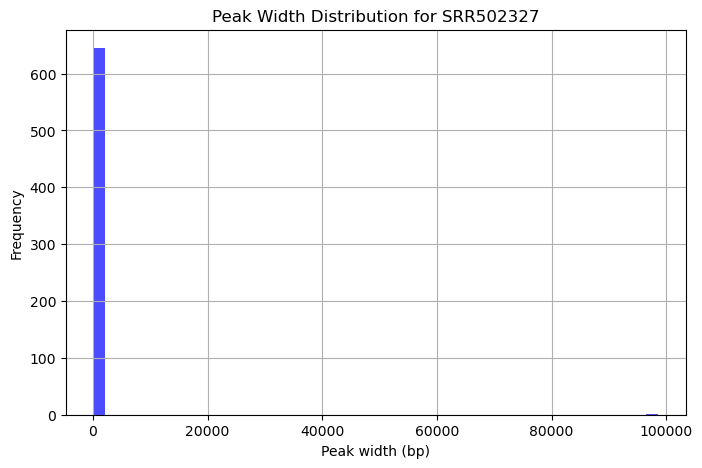

Summary statistics generated for SRR502327.
Total peaks: 646
Peak summary saved: /home/abhi39/Projects/CHIPseq/output/6_peak_statistics/SRR502327_peak_summary.csv


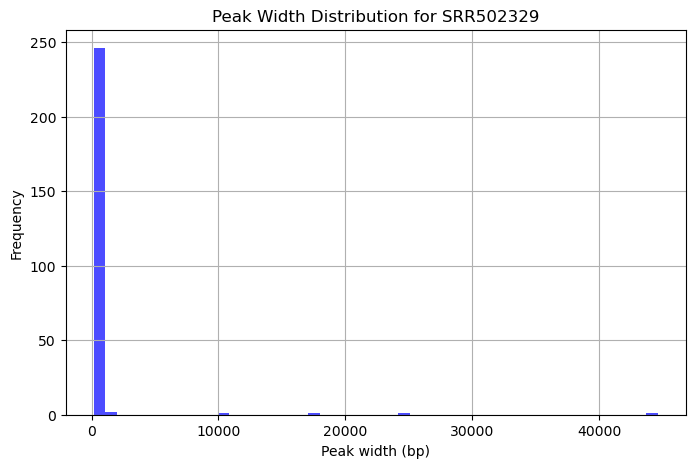

Summary statistics generated for SRR502329.
Total peaks: 252
Peak summary saved: /home/abhi39/Projects/CHIPseq/output/6_peak_statistics/SRR502329_peak_summary.csv
Peak summary statistics and visualuizations complete.


In [20]:
import pandas as pd
import matplotlib.pyplot as plt

# Define directory for summary statistics
peak_stats_dir = os.path.join(output_dir, "6_peak_statistics")
os.makedirs(peak_stats_dir, exist_ok = True)



def summarize_macs2_peaks (sample_id):
    """Summarizes MACS2 peaks: peak count and peak width distribution."""
    
    peaks_file = os.path.join(macs_output_dir, f"{sample_id}_peaks.narrowPeak")
    
    # Read MACS peaks file
    columns = ["chr", "start", "end", "name", "score", "strand", "signalValue", "pValue", "qValue", "peak"]
    peaks_df = pd.read_csv(peaks_file, sep = "\t", names = columns)
    
    # Compute peak widths
    peaks_df["width"] = peaks_df["end"] - peaks_df["start"]
    
    # Save peak summary
    summary_file = os.path.join(peak_stats_dir, f"{sample_id}_peak_summary.csv")
    peaks_df.to_csv(summary_file, index = False)
    
    # Plot peak width distribution
    plt.figure(figsize=(8,5))
    plt.hist(peaks_df["width"], bins = 50, color = "blue", alpha = 0.7)
    plt.xlabel("Peak width (bp)")
    plt.ylabel("Frequency")
    plt.title(f"Peak Width Distribution for {sample_id}")
    plt.grid(True)
    plt.savefig(os.path.join(peak_stats_dir, f"{sample_id}_peak_width_distribution.png"))
    plt.show()
    
    print(f"Summary statistics generated for {sample_id}.")
    print(f"Total peaks: {len(peaks_df)}")
    print(f"Peak summary saved: {summary_file}")
    
# Generate statistics for all MACS2 peak files
for sample_id in samples.keys():
    summarize_macs2_peaks(sample_id)
    
print("Peak summary statistics and visualuizations complete.")
    

#### Step 7. Differential Peak Analysis with DiffBind 

In [27]:
# (didnt work with macs2 as it requires t1, t1, c1 and c2 and I only have t1 and t2)

import os
import subprocess

# Define directories
base_dir = "/home/abhi39/Projects/CHIPseq"
macs_output_dir = os.path.join(base_dir, "output/4_peak_calling/output")
macs_output_dir2 = os.path.join(base_dir, "output/4_peak_calling/output2")

# Define sample names
sample1 = "SRR502327"  # IFNa6h
sample2 = "SRR502329"  # IFNa30h

# Define required input files from MACS2
treat_bdg1 = os.path.join(macs_output_dir, f"{sample1}_treat_pileup.bdg")
treat_bdg2 = os.path.join(macs_output_dir, f"{sample2}_treat_pileup.bdg")

# Define output prefix
bdgdiff_output = os.path.join(macs_output_dir2, f"{sample1}_vs_{sample2}_bdgdiff")

# Ensure all required files exist
for file in [treat_bdg1, treat_bdg2]:
    if not os.path.exists(file):
        print(f"Error: {file} not found.")
        exit(1)

# MACS2 bdgdiff command
bdgdiff_cmd = [
    "macs2", "bdgdiff",
    "--t1", treat_bdg1,  # Treatment sample 1 (IFNa6h)
    "--c1", treat_bdg1, # Pseudo-control
    "--t2", treat_bdg2,  # Treatment sample 2 (IFNa30h)
    "--c2", treat_bdg2, # Pseudo-control
    "--o-prefix", bdgdiff_output,  # Output prefix
    "--d1", "5", "--d2", "5"  # Default pseudocount depth (adjust if needed)
]

# Run the command and capture output
try:
    subprocess.run(bdgdiff_cmd, check=True)
    print(f"MACS2 bdgdiff analysis complete! Results saved in {macs_output_dir2}")
except subprocess.CalledProcessError as e:
    print("Error running MACS2 bdgdiff:", e)

INFO  @ Sat, 01 Feb 2025 16:43:46: Read and build treatment 1 bedGraph... 
INFO  @ Sat, 01 Feb 2025 16:43:54: Read and build control 1 bedGraph... 
INFO  @ Sat, 01 Feb 2025 16:44:01: Read and build treatment 2 bedGraph... 
INFO  @ Sat, 01 Feb 2025 16:44:09: Read and build control 2 bedGraph... 


MACS2 bdgdiff analysis complete! Results saved in /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output2


INFO  @ Sat, 01 Feb 2025 16:44:38: Write peaks... 
INFO  @ Sat, 01 Feb 2025 16:44:38: Done 


#### Differential binding (the one that worked)
* Convert .bdg to .bed file and 
* sorts peaks to ensure correct genomic order
* identifies differential peaks and common peaks

In [98]:
import os
import subprocess

# Define Base Directories
base_dir = "/home/abhi39/Projects/CHIPseq"
output_dir = os.path.join(base_dir, "output")
macs_output_dir = os.path.join(output_dir, "4_peak_calling", "output")
diffbind_output_dir = os.path.join(macs_output_dir, "differential_binding")

# Ensure output directory exists
os.makedirs(diffbind_output_dir, exist_ok=True)

# Define Peak Files
treat_6h = os.path.join(macs_output_dir, "SRR502327_treat_pileup.bdg")  # IFNa6h
treat_30h = os.path.join(macs_output_dir, "SRR502329_treat_pileup.bdg") # IFNa30h

# Define Output Files
treat_6h_bed = os.path.join(diffbind_output_dir, "SRR502327_treat.bed")
treat_30h_bed = os.path.join(diffbind_output_dir, "SRR502329_treat.bed")

# Genome chromosome sizes file
genome_file = "genome/genome/hg38.chrom.sizes"  # Ensure this file exists!

# Convert .bdg to .bed (Extracting chromosome, start, and end with additional columns for compatibility)
for bdg, bed in zip([treat_6h, treat_30h], [treat_6h_bed, treat_30h_bed]):
    with open(bed, "w") as out:
        subprocess.run(
            ["awk", 'BEGIN {OFS="\t"} {print $1, $2, $3, "Peak_"NR, "1000", "+"}', bdg],
            stdout=out
        )

# Sort .bed files based on genome file
sorted_treat_6h_bed = os.path.join(diffbind_output_dir, "SRR502327_treat_sorted.bed")
sorted_treat_30h_bed = os.path.join(diffbind_output_dir, "SRR502329_treat_sorted.bed")

subprocess.run(["bedtools", "sort", "-i", treat_6h_bed, "-g", genome_file], stdout=open(sorted_treat_6h_bed, "w"))
subprocess.run(["bedtools", "sort", "-i", treat_30h_bed, "-g", genome_file], stdout=open(sorted_treat_30h_bed, "w"))

# Identify unique peaks in IFNa30h (gain in binding at 30h)
unique_30h = os.path.join(diffbind_output_dir, "unique_IFNa30h.bed")
subprocess.run(["bedtools", "subtract", "-a", sorted_treat_30h_bed, "-b", sorted_treat_6h_bed], stdout=open(unique_30h, "w"))

# Identify unique peaks in IFNa6h (gain in binding at 6h)
unique_6h = os.path.join(diffbind_output_dir, "unique_IFNa6h.bed")
subprocess.run(["bedtools", "subtract", "-a", sorted_treat_6h_bed, "-b", sorted_treat_30h_bed], stdout=open(unique_6h, "w"))

# Identify common peaks shared between IFNa6h and IFNa30h
common_peaks = os.path.join(diffbind_output_dir, "common_peaks.bed")
subprocess.run(["bedtools", "intersect", "-a", sorted_treat_6h_bed, "-b", sorted_treat_30h_bed], stdout=open(common_peaks, "w"))

print("Differential peak analysis completed successfully!")

***** WARNING: File /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/SRR502327_treat_sorted.bed has inconsistent naming convention for record:
GL000008.2	0	14	Peak_1	1000	+

***** WARNING: File /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/SRR502327_treat_sorted.bed has inconsistent naming convention for record:
GL000008.2	0	14	Peak_1	1000	+

***** WARNING: File /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/SRR502329_treat_sorted.bed has inconsistent naming convention for record:
GL000008.2	0	6	Peak_1	1000	+

***** WARNING: File /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/SRR502329_treat_sorted.bed has inconsistent naming convention for record:
GL000008.2	0	6	Peak_1	1000	+

***** WARNING: File /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/SRR502329_treat_sorted.bed has inconsistent naming convention for record:
GL000008

Differential peak analysis completed successfully!


***** WARNING: File /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/SRR502329_treat_sorted.bed has inconsistent naming convention for record:
GL000008.2	0	6	Peak_1	1000	+



#### Step 8: Motif analysis using Homer after DiffBind ()
* To find general STAT1 binding motifs using background corrected 
* helps identify true STAT1-associated motifs that are unique to each time points.

* perl /home/abhi39/miniconda3/envs/macs2_env/share/homer/configureHomer.pl -list in bash to check the list of genomes downloaded in HOMER

* perl /home/abhi39/miniconda3/envs/macs2_env/share/homer/configureHomer.pl -install hg38 
to install hg38

##### 8.1: Create separate background files for each time points

In [108]:
# Create separate background files

# Define background output directories (for both peak sets)
background_output_dir = os.path.join(output_dir, "7_motif_analysis")
os.makedirs(background_output_dir, exist_ok = True)

background_IFNa6h = os.path.join(background_output_dir, "background_IFNa6h.bed")
background_IFNa30h = os.path.join(background_output_dir, "background_IFNa30h.bed")

# Define input BED files 
bed_6h = os.path.join(output_dir, "4_peak_calling", "output", "differential_binding", "unique_IFNa6h.bed")
bed_30h = os.path.join(output_dir, "4_peak_calling", "output", "differential_binding", "unique_IFNa30h.bed")

# Genome chromosome sizes file
genome_file = "genome/genome/hg38.chrom.sizes"

def create_background(peak_file, output_file):
    """Create background files using BEDTools for motif analysis 
    helps in better statistical comparison and meaningful results."""
    
    command = ["bedtools", "shuffle", "-i", peak_file, "-g", genome_file]
    print (f"Creating background file for {peak_file}...")
    
    with open(output_file, "w") as out:
        subprocess.run(command, stdout=out, stderr=subprocess.PIPE, check=True)
        
    
    print(f"Background file saved in {output_file}")
    
# Run HOMER motif analysis
create_background(bed_6h, background_IFNa6h)
create_background(bed_30h, background_IFNa30h)

print("Background file generation completed successfully!")


Creating background file for /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/unique_IFNa6h.bed...
Background file saved in /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/background_IFNa6h.bed
Creating background file for /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/unique_IFNa30h.bed...
Background file saved in /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/background_IFNa30h.bed
Background file generation completed successfully!


##### 8.2 Run HOMER for motif enrichment analysis

In [ ]:
import os
import subprocess

# Define directories
base_dir = "/home/abhi39/Projects/CHIPseq"
output_dir = os.path.join(base_dir, "output")
homer_output_dir = os.path.join(output_dir, "7_motif_analysis")

# Ensure output directory exists
os.makedirs(homer_output_dir, exist_ok=True)

# Define input BED files (filtered peaks from previous step)
bed_6h = os.path.join(output_dir, "4_peak_calling", "output", "differential_binding", "unique_IFNa6h.bed")
bed_30h = os.path.join(output_dir, "4_peak_calling", "output", "differential_binding", "unique_IFNa30h.bed")

# Define background files
background_6h = os.path.join(homer_output_dir, "background_IFNa6h.bed")
background_30h = os.path.join(homer_output_dir, "background_IFNa30h.bed")

# Define genome
genome = "hg38"

# Define HOMER output directories (for both peak sets)
homer_6h_out = os.path.join(homer_output_dir, "IFNa6h_motif")
homer_30h_out = os.path.join(homer_output_dir, "IFNa30h_motif")

# Ensure HOMER output directories exist
os.makedirs(homer_6h_out, exist_ok=True)
os.makedirs(homer_30h_out, exist_ok=True)

def run_homer(peak_file, background_file, output_dir):
    """Run HOMER findMotifsGenome.pl with background correction."""
    
    command = [
        "findMotifsGenome.pl", peak_file, genome, output_dir,
        "-size", "200",  #  motif size 
        "-len", "8,10,12,15",  # Motif lengths
        "-mis", "1",  # Allow 1 mismatch in motifs
        "-p", "4",  # Use 4 CPU cores for speedup
        "-bg", background_file  # Use background file for statistical correction
    ]
    
    print(f"Running HOMER motif analysis for {peak_file} with background {background_file}...")
    subprocess.run(command, check=True)
    print(f"Motif results saved in {output_dir}")

# Run HOMER motif analysis with background correction
run_homer(bed_6h, background_6h, homer_6h_out)
run_homer(bed_30h, background_30h, homer_30h_out)

print("HOMER motif enrichment analysis completed!")

Running HOMER motif analysis for /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/unique_IFNa6h.bed with background /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/background_IFNa6h.bed...



	Position file = /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/unique_IFNa6h.bed
	Genome = hg38
	Output Directory = /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/IFNa6h_motif
	Fragment size set to 200
	Motif length set at 8,10,12,15,*** might want to hit ctrl+C to quit if it takes too long!
*** If you run out of memmory try reducing the number background sequences

	Will search for strings with 1 mismatches
	Using 4 CPUs
	background position file: /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/background_IFNa6h.bed
	Found mset for "human", will check against vertebrates motifs
	Peak/BED file conversion summary:
		BED/Header formatted lines: 236
		peakfile formatted lines: 0

	Peak File Statistics:
		Total Peaks: 236
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak 

Motif results saved in /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/IFNa6h_motif
Running HOMER motif analysis for /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/unique_IFNa30h.bed with background /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/background_IFNa30h.bed...


	Extracting 6 sequences from chr10
	Extracting 11 sequences from chr11
	Extracting 4 sequences from chr12
	Extracting 8 sequences from chr13
	Extracting 5 sequences from chr14
	Extracting 7 sequences from chr15
	Extracting 5 sequences from chr16
	Extracting 5 sequences from chr17
	Extracting 11 sequences from chr18
	Extracting 5 sequences from chr19
	Extracting 22 sequences from chr2
	Extracting 3 sequences from chr20
	Extracting 5 sequences from chr21
	Extracting 4 sequences from chr22
	Extracting 19 sequences from chr3
	Extracting 10 sequences from chr4
	Extracting 15 sequences from chr5
	Extracting 11 sequences from chr6
	Extracting 15 sequences from chr7
	Extracting 9 sequences from chr8
	Extracting 9 sequences from chr9
	Extracting 15 sequences from chrX
	Extracting 6 sequences from chrY
		13 of 226 removed because they had >70.00% Ns (i.e. masked repeats)

	Not removing redundant sequences


	Sequences processed:
		Auto detected maximum sequence length of 201 bp
		213 total

	Fre

Motif results saved in /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/IFNa30h_motif
HOMER motif enrichment analysis completed!


	Formatting HTML page...
		1 of 15 (1e-16) similar to OSR2/MA1646.2/Jaspar(0.599)
		2 of 15 (1e-16) similar to IRF4/MA1419.2/Jaspar(0.579)
		3 of 15 (1e-13) similar to Sox7/MA2095.1/Jaspar(0.629)
		4 of 15 (1e-13) similar to PB0120.1_Foxj1_2/Jaspar(0.642)
		5 of 15 (1e-11) similar to PH0016.1_Cux1_1/Jaspar(0.699)
		6 of 15 (1e-9) similar to Hmga1/MA2124.1/Jaspar(0.785)
		7 of 15 (1e-8) similar to MEF2C/MA0497.2/Jaspar(0.687)
		8 of 15 (1e-8) similar to Prdm14/MA1998.2/Jaspar(0.750)
		9 of 15 (1e-8) similar to ZNF384/MA1125.2/Jaspar(0.641)
		10 of 15 (1e-8) similar to Six3/MA0631.2/Jaspar(0.821)
		11 of 15 (1e-7) similar to PH0045.1_Hoxa1/Jaspar(0.683)
		12 of 15 (1e-6) similar to PB0174.1_Sox30_2/Jaspar(0.718)
		13 of 15 (1e-6) similar to Pax7/MA0680.3/Jaspar(0.807)
		14 of 15 (1e-4) similar to CHR(?)/Hela-CellCycle-Expression/Homer(0.828)
		15 of 15 (1e-2) similar to Egr1(Zf)/K562-Egr1-ChIP-Seq(GSE32465)/Homer(0.818)
	Job finished - if results look good, please send beer to ..

	Clean

#### Step 9: Load and Visualize HOMER results

In [110]:
import os
import pandas as pd

# Define HOMER output directories
homer_output_dir = "/home/abhi39/Projects/CHIPseq/output/7_motif_analysis"
homer_6h_out = os.path.join(homer_output_dir, "IFNa6h_motif")
homer_30h_out = os.path.join(homer_output_dir, "IFNa30h_motif")

# Define motif files
motif_file_6h = os.path.join(homer_6h_out, "knownResults.txt")
motif_file_30h = os.path.join(homer_30h_out, "knownResults.txt")

# Load HOMER motif results into Pandas DataFrame
def load_homer_results(motif_file):
    if os.path.exists(motif_file):
        df = pd.read_csv(motif_file, sep="\t")
        return df
    else:
        print(f"File not found: {motif_file}")
        return None

df_6h = load_homer_results(motif_file_6h)
df_30h = load_homer_results(motif_file_30h)

# Display top 5 motifs for each condition
if df_6h is not None:
    print("\nTop 5 enriched motifs in IFNa6h condition:")
    print(df_6h.head())

if df_30h is not None:
    print("\nTop 5 enriched motifs in IFNa30h condition:")
    print(df_30h.head())


Top 5 enriched motifs in IFNa6h condition:
                                                      Motif Name  \
0          Atoh1(bHLH)/Cerebellum-Atoh1-ChIP-Seq(GSE22111)/Homer   
1  NFAT:AP1(RHD,bZIP)/Jurkat-NFATC1-ChIP-Seq(Jolma_et_al.)/Homer   
2            Tcfcp2l1(CP2)/mES-Tcfcp2l1-ChIP-Seq(GSE11431)/Homer   
3                ZNF341(Zf)/EBV-ZNF341-ChIP-Seq(GSE113194)/Homer   
4            FOXM1(Forkhead)/MCF7-FOXM1-ChIP-Seq(GSE72977)/Homer   

              Consensus  P-value  Log P-value  q-value (Benjamini)  \
0          VNRVCAGCTGGY   0.0001       -9.895               0.0238   
1  SARTGGAAAAWRTGAGTCAB   0.0001       -9.224               0.0238   
2  NRAACCRGTTYRAACCRGYT   0.0001       -9.224               0.0238   
3            GGAACAGCCG   0.0010       -9.013               0.0238   
4            TRTTTACTTW   0.0010       -7.063               0.0808   

   # of Target Sequences with Motif(of 10) % of Target Sequences with Motif  \
0                                      5.0     

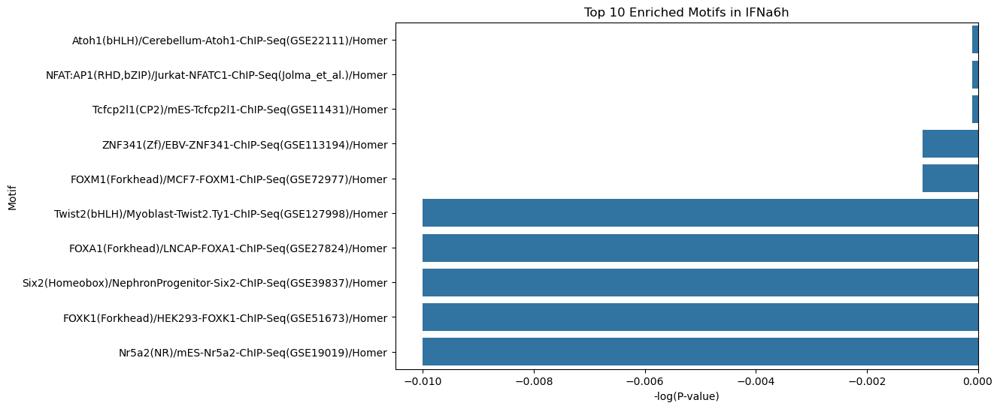

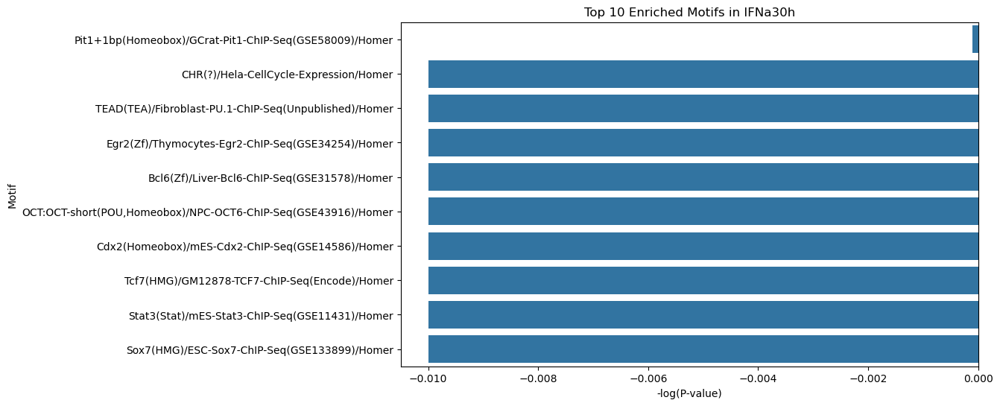

In [111]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot motif enrichment
def plot_motif_enrichment(df, title):
    if df is not None:
        plt.figure(figsize=(10, 6))
        top_motifs = df.sort_values("P-value").head(10)  # Select top 10 motifs
        sns.barplot(x=-top_motifs["P-value"], y=top_motifs["Motif Name"])
        plt.xlabel("-log(P-value)")
        plt.ylabel("Motif")
        plt.title(title)
        plt.show()
    else:
        print("No data to plot.")

# Plot motifs for both conditions
plot_motif_enrichment(df_6h, "Top 10 Enriched Motifs in IFNa6h")
plot_motif_enrichment(df_30h, "Top 10 Enriched Motifs in IFNa30h")

In [ ]:
# 9c. Generate a heatmap of motif occurence (re code this)
import numpy as np
import seaborn as sns

# Load motif occurrence matrix
motif_matrix_file = os.path.join(homer_results_dir, "homerMotifs.motif")
motif_matrix = pd.read_csv(motif_matrix_file, sep="\t", index_col=0)

# Convert to numpy matrix
motif_data = motif_matrix.iloc[:, 1:].to_numpy()

# Generate heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(motif_data, cmap="Blues", xticklabels=False, yticklabels=True)
plt.title("Motif Occurrence Heatmap")
plt.show()

Functional annotation of Differentially Bound Regions (might delete later)
* annotate peaks to identify their genomic locations (eg. promoter, enhancer, intronic or intergenic, etc.). 
* This helps us understand where STAT1 is binding and which genes are potentially regulated.
Identify which genes are associated with differential peaks and perform Gene Ontology (GO) and pathway enrichment analysis.
* We will use HOMER's annotatePeaks.pl for peak annotations. It maps ChIP-seq peaks to the nearest genes and provide additional genomic context.

#### Step 10: Functional annotation of Differentially Bound STAT1 peaks
* assigns genomic features (eg. promoter, intron, intergenic) and identify nearest genes for each STAT1 peak
Example Output Interpretation (from annotated_IFNa6h.txt):
* Annotation: Where the peak is located (Promoter, Enhancer, Intron, Intergenic, etc.).
* Nearest Gene Name: The gene closest to the peak.
* Distance to TSS: How far the peak is from the Transcription Start Site (TSS).
* Entrez ID: Unique gene identifier for downstream enrichment.
* tells us which genes are associated with STAT1 binding
* helps us understand whether STAT1 preferentially binds to promoters, enhancers, or other genomic regions.


##### Step 10.1: Annotation of Differentially Bound STAT1 peaks

In [120]:
# new code
import os
import subprocess

# Define directories
base_dir = "/home/abhi39/Projects/CHIPseq"
output_dir = os.path.join(base_dir, "output")
homer_annotation_dir = os.path.join(output_dir, "8_peak_annotation")

# Ensure output directory exists
os.makedirs(homer_annotation_dir, exist_ok=True)

# Define input BED files (differential peaks)
bed_6h = os.path.join(output_dir, "4_peak_calling", "output", "differential_binding", "unique_IFNa6h.bed")
bed_30h = os.path.join(output_dir, "4_peak_calling", "output", "differential_binding", "unique_IFNa30h.bed")

# Define output files
annotated_6h = os.path.join(homer_annotation_dir, "annotated_IFNa6h.txt")
annotated_30h = os.path.join(homer_annotation_dir, "annotated_IFNa30h.txt")

# Define genome
genome = "hg38"  # reference genome

def annotate_peaks(peak_file, output_file):
    """Run HOMER annotatePeaks.pl to annotate ChIP-seq peaks."""
    
    command = [
        "annotatePeaks.pl", peak_file, genome,
        "-annStats", output_file.replace(".txt", "_stats.txt"), # Summary stats
        ">", output_file # Output annotation file
    ]
    
    print(f"Annotating peaks in {peak_file}...")
    subprocess.run(" ".join(command), shell=True, check=True)
    print(f"Annotation results saved in {output_file}")

# Run HOMER annotation
annotate_peaks(bed_6h, annotated_6h)
annotate_peaks(bed_30h, annotated_30h)

# **Ensure Peak_ID is not indexed when reading with pandas**
import pandas as pd

# Load annotation results without setting an index
df_6h = pd.read_csv(annotated_6h, sep="\t", comment="#", header=0, index_col=False)
df_30h = pd.read_csv(annotated_30h, sep="\t", comment="#", header=0, index_col=False)

# Ensure Peak_ID remains a separate column
if "PeakID" in df_6h.columns and df_6h.index.name is None:
    print("Peak_ID is correctly treated as a separate column (not an index) in IFNa6h.")
if "PeakID" in df_30h.columns and df_30h.index.name is None:
    print("Peak_ID is correctly treated as a separate column (not an index) in IFNa30h.")

# Save corrected annotation files without index
df_6h.to_csv(annotated_6h, sep="\t", index=False)
df_30h.to_csv(annotated_30h, sep="\t", index=False)

print("Annotation files saved with Peak_ID as a separate column, not an index!")

Annotating peaks in /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/unique_IFNa6h.bed...



	Peak file = /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/unique_IFNa6h.bed
	Genome = hg38
	Organism = human
	Peak/BED file conversion summary:
		BED/Header formatted lines: 236
		peakfile formatted lines: 0
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 236
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	-----------------------
	offset=0
	Finding Closest TSS...
	Annotating:...........
		Annotation	Number of peaks	Total size (bp)	Log2 Ratio (obs/exp)	LogP enrichment (+values depleted)
		3UTR	0.0	13678567	-0.226	0.168
		miRNA	0.0	46566	-0.001	0.001
		ncRNA	0.0	3636235	-0.063	0.045
		TTS	0.0	16004856	-0.261	0.197
		pseudo	0.0	1044497	-0.018	0.013
		Exon	0.0	18149263	-0.293	0.224
		Intron	0.0	627804747	-3.852	10.040
		Inter

Annotation results saved in /home/abhi39/Projects/CHIPseq/output/8_peak_annotation/annotated_IFNa6h.txt
Annotating peaks in /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/unique_IFNa30h.bed...



	Peak file = /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/unique_IFNa30h.bed
	Genome = hg38
	Organism = human
	Peak/BED file conversion summary:
		BED/Header formatted lines: 208
		peakfile formatted lines: 0
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 208
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	-----------------------
	offset=0
	Finding Closest TSS...
	Annotating:.............
		Annotation	Number of peaks	Total size (bp)	Log2 Ratio (obs/exp)	LogP enrichment (+values depleted)
		3UTR	0.0	13501771	-0.203	0.151
		miRNA	0.0	62988	-0.001	0.001
		ncRNA	0.0	3541878	-0.056	0.039
		TTS	0.0	16644907	-0.247	0.186
		pseudo	0.0	1075237	-0.017	0.012
		Exon	0.0	19418800	-0.285	0.217
		Intron	0.0	637298138	-3.666	9.012
		Int

Annotation results saved in /home/abhi39/Projects/CHIPseq/output/8_peak_annotation/annotated_IFNa30h.txt
Annotation files saved with Peak_ID as a separate column, not an index!


##### Step 10.2: Filter genes without Entrez ID before GO Enrichment
* ensures only well- annotated genes are used in GO analysis.

In [60]:
# 10.2 Filter out rows with NA from peak file
import pandas as pd

# Define file paths
anno_6h = os.path.join(diffbind_output_dir, "IFNa6h_annotated.txt")
anno_30h = os.path.join(diffbind_output_dir, "IFNa30h_annotated.txt")

# Load annotation files
df_6h = pd.read_csv(anno_6h, sep = "\t")
df_30h = pd.read_csv(anno_30h, sep = "\t")

# Remove rows where Entrez ID (column 11) is NA
df_6h_filtered = df_6h.dropna(subset = ["Entrez ID"])
df_30h_filtered = df_30h.dropna(subset= ["Entrez ID"])

# Define output file paths
filtered_anno_6h = os.path.join(diffbind_output_dir, "filtered_IFNa6h_annotation.txt")
filtered_anno_30h = os.path.join(diffbind_output_dir,"filtered_IFNa30h_annotation.txt")

# Save filtered annotation files
df_6h_filtered.to_csv(filtered_anno_6h, sep = "\t", index = False)
df_30h_filtered.to_csv(filtered_anno_30h, sep = "\t", index = False)

print("Filtered annotation fiels saved")

Filtered annotation fiels saved


##### Step 10.3 Perform Gene Ontology (GO) Enrichment using HOMER (findGO)
* produces 3 main types of GO enrichment results:
1. Biological process: What biological processes are regulated by the genes near STAT1 binding sites?
2. Molecular function: What kind of protein functions are enriched in STAT1-bound genes?
3. Cellular component: Where in the cell do these genes function?

In [ ]:
# 10.3 Perform Gene Ontology (GO) Enrichment using HOMER (findGO)

# Set output directories
go_6h_out = os.path.join(diffbind_output_dir, "GO_IFNa6h")
go_30h_out = os.path.join(diffbind_output_dir, "GO_IFNa30h")
os.makedirs(go_6h_out, exist_ok=True)
os.makedirs(go_30h_out, exist_ok=True)

# Define input files
filtered_anno_6h = os.path.join(diffbind_output_dir, "filtered_IFNa6h_annotation.txt")
filtered_anno_6h = os.path.join(diffbind_output_dir,"filtered_IFNa30h_annotation.txt")

def run_homer_go(annotation_file, output_dir):
    """Perform GO enrichment analysis using HOMER's findGO.pl"""
    command = ["findGO.pl", annotation_file, "human", output_dir]
    print(f"Running GO enrichment on {annotation_file}...")
    subprocess.run(" ".join(command), shell = True, check=True)
    print(f"GO enrichment results save din {output_dir}")
    
# Run GO enrichment analysis
run_homer_go(filtered_anno_6h, go_6h_out)
run_homer_go(filtered_anno_30h, go_30h_out)

Running GO enrichment on /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/filtered_IFNa30h_annotation.txt...


rm: cannot remove '0.925240123967768.bg.tmp': No such file or directory


GO enrichment results save din /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/GO_IFNa6h
Running GO enrichment on /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/filtered_IFNa30h_annotation.txt...


rm: cannot remove '0.94245631093824.bg.tmp': No such file or directory


GO enrichment results save din /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/GO_IFNa30h


##### 10.4 Visualization of GO Enrichment 

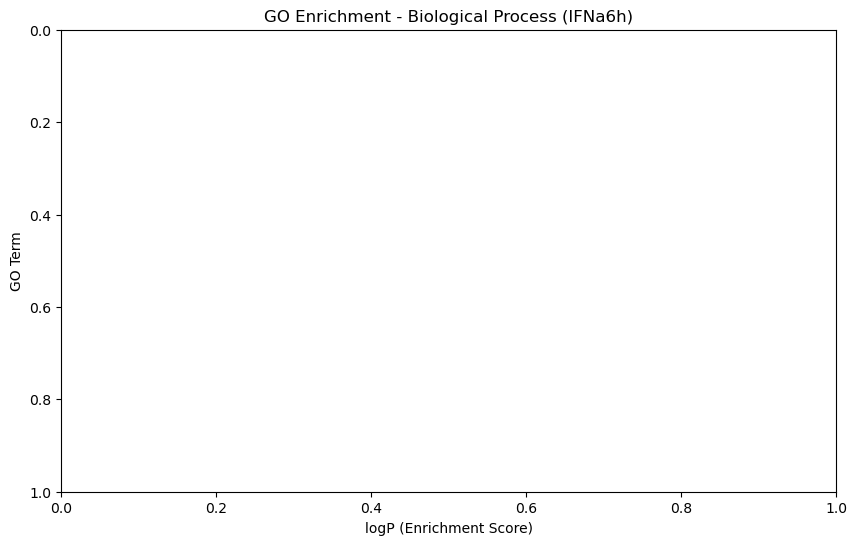

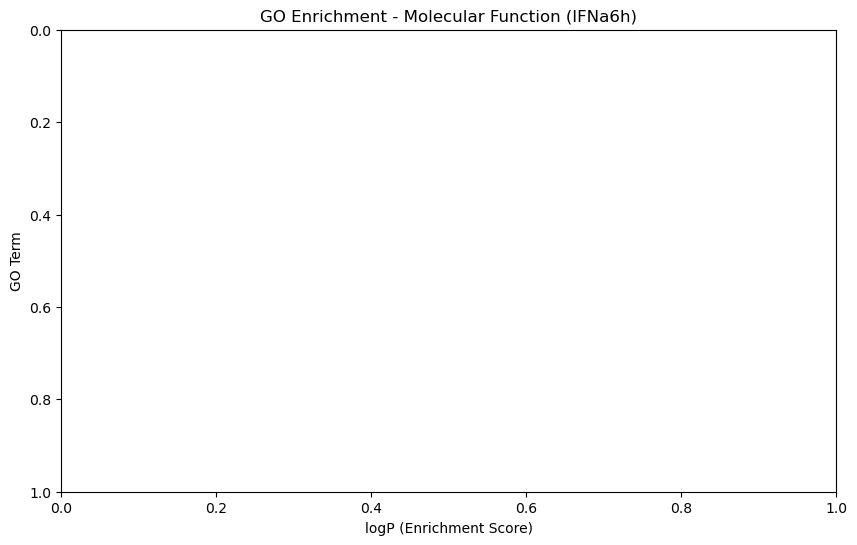

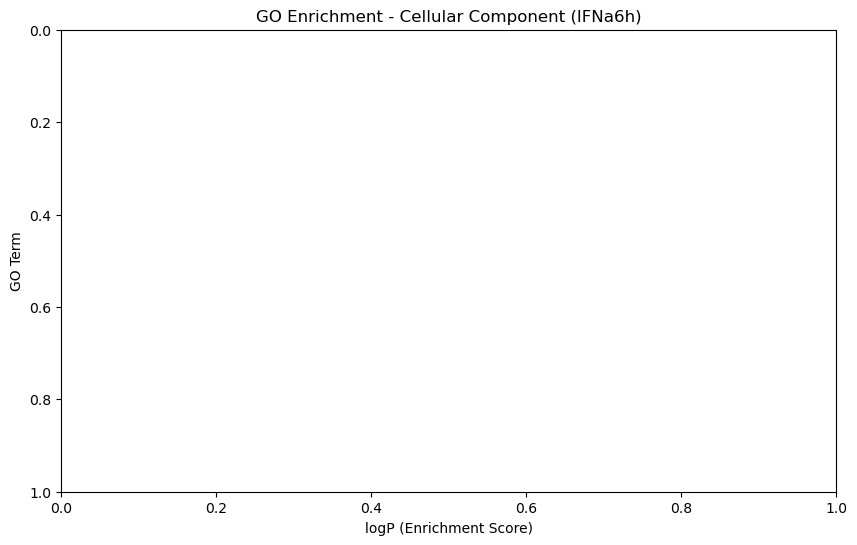

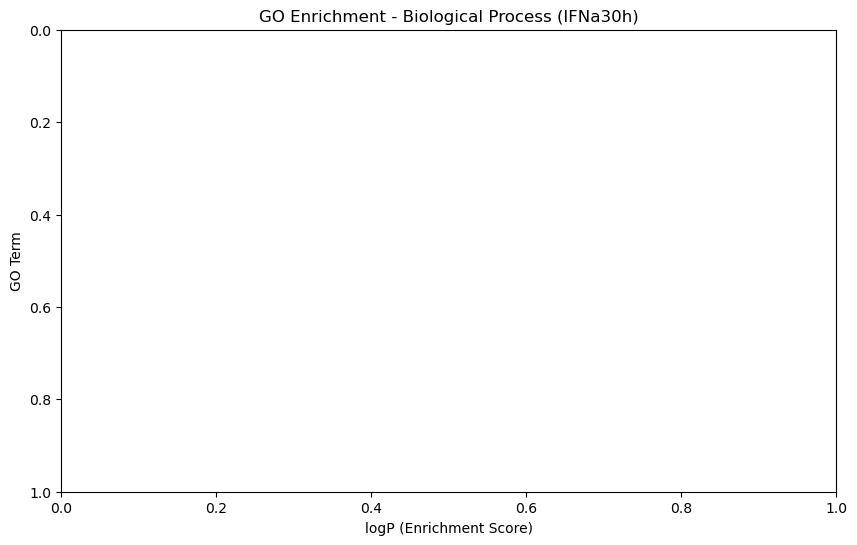

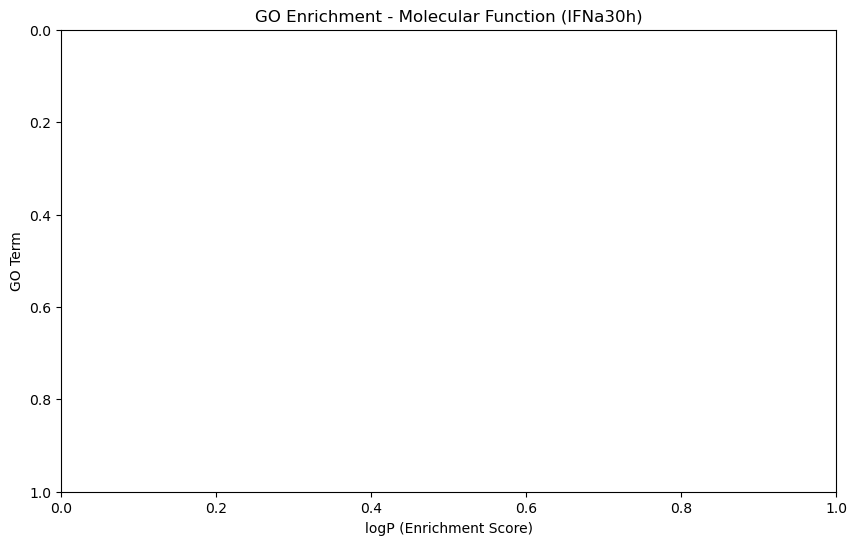

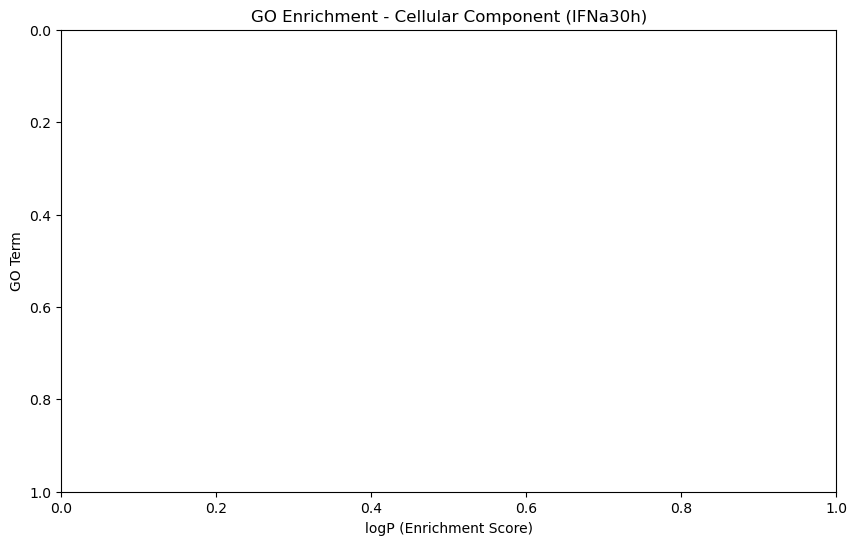

In [70]:
# 10.4 Visualization of GO Enrichment
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define GO enrichment result files
go_files = {
    "Biological Process": "biological_process.txt",
    "Molecular Function": "molecular_function.txt",
    "Cellular Component": "cellular_component.txt"
}

# Define GO result directories for IFNa6h and IFNa30h
go_dirs = {
    "IFNa6h": os.path.join(diffbind_output_dir, "GO_IFNa6h"),
    "IFNa30h": os.path.join(diffbind_output_dir, "GO_IFNa30h")
}

def plot_go_enrichment(go_file, title):
    """Reads GO enrichment results and plots the top significant GO terms."""
    
    # Read GO file
    go_data = pd.read_csv(go_file, sep="\t")
    
    # Ensure required columns exist
    if "Term" not in go_data.columns or "logP" not in go_data.columns:
        print(f"Skipping {go_file}: Required columns missing")
        return
    
    # Ensure values are numeric and drop invalid rows
    go_data["logP"] = pd.to_numeric(go_data["logP"], errors="coerce")
    go_data = go_data.dropna().sort_values(by="logP", ascending=False).head(10)  # Top 10 GO terms
    
    # Plotting
    plt.figure(figsize=(10, 6))
    sns.barplot(x="logP", y="Term", data=go_data, palette="coolwarm")
    
    plt.xlabel("logP (Enrichment Score)")
    plt.ylabel("GO Term")
    plt.title(title)
    plt.gca().invert_yaxis()  # Invert y-axis for better readability
    
    plt.show()

# Loop through each GO category and plot for both conditions
for condition, go_dir in go_dirs.items():
    for category, filename in go_files.items():
        go_path = os.path.join(go_dir, filename)
        if os.path.exists(go_path):
            plot_go_enrichment(go_path, f"GO Enrichment - {category} ({condition})")
        else:
            print(f"Warning: {filename} not found in {go_dir}")

##### Probable reasons why we did not observe any significant results after GO enrichment analysis
1. STAT1 is a TF, not a direct gene regulator as it binds to DNA to regulate other TF.
2. Many of the peaks might be in enhancers or intergenic regions rather than promoters (therefore, GO terms tied to protein-coding genes may not be enriched)
3. If most peaks are in enhancers or intergenic regions, the genes assigned during annotation may not be well-characterized in GO databases.
* GO relies on annotated genes; if your peaks fall in poorly annotated regions, you might get no significant enrichment.
* Since STAT1 binding sites are often in enhancers that regulate other transcription factors, rather than genes with direct biological functions, Transcription factor enrichment analysis (TFEA) may be more informative than GO enrichment. 

#### 11: Perform Transcription factor enrichment analysis

##### 11.1 Classify peaks into enhancer-associated and promoter-asscoiated (1. Distance-based classification)
Step: Filter peaks based on distance from TSS
* After annotation, we classify peaks as:
** Promoters: -1kb to +1kb from TSS
** Distal enhancers: > 2kb from TSS

In [115]:
import pandas as pd

# Load annotation results
df_6h = pd.read_csv(annotated_6h, sep="\t", comment="#", header=0)
df_30h = pd.read_csv(annotated_30h, sep="\t", comment="#", header=0)

# Rename columns for clarity (Check the actual column names in HOMER output)
df_6h.columns = ["PeakID", "Chr", "Start", "End", "Strand", "Peak_Score", "Focus_Ratio",
    "Annotation", "Detailed_Annotation", "Distance_to_TSS", "Nearest_PromoterID",
    "Entrez_ID", "Nearest_Unigene", "Nearest_Refseq", "Nearest_Ensembl",
    "Gene_Name", "Gene_Alias", "Gene_Description", "Gene_Type"]
df_30h.columns = ["PeakID", "Chr", "Start", "End", "Strand", "Peak_Score", "Focus_Ratio",
    "Annotation", "Detailed_Annotation", "Distance_to_TSS", "Nearest_PromoterID",
    "Entrez_ID", "Nearest_Unigene", "Nearest_Refseq", "Nearest_Ensembl",
    "Gene_Name", "Gene_Alias", "Gene_Description", "Gene_Type"]

# Convert Distance_TSS to numeric values
df_6h["Distance_to_TSS"] = pd.to_numeric(df_6h["Distance_to_TSS"], errors="coerce")
df_30h["Distance_to_TSS"] = pd.to_numeric(df_30h["Distance_to_TSS"], errors="coerce")

# Filter Promoter Peaks (-1000bp to +1000bp from TSS)
promoter_6h = df_6h[(df_6h["Distance_to_TSS"] >= -1000) & (df_6h["Distance_to_TSS"] <= 1000)]
promoter_30h = df_30h[(df_30h["Distance_to_TSS"] >= -1000) & (df_30h["Distance_to_TSS"] <= 1000)]

# Filter Enhancer/Distal Peaks (>2000bp from TSS)
enhancer_6h = df_6h[abs(df_6h["Distance_to_TSS"]) > 2000]
enhancer_30h = df_30h[abs(df_30h["Distance_to_TSS"]) > 2000]

# Save filtered results
promoter_6h.to_csv(os.path.join(homer_annotation_dir, "promoter_IFNa6h.bed"), sep="\t", index=False)
promoter_30h.to_csv(os.path.join(homer_annotation_dir, "promoter_IFNa30h.bed"), sep="\t", index=False)
enhancer_6h.to_csv(os.path.join(homer_annotation_dir, "enhancer_IFNa6h.bed"), sep="\t", index=False)
enhancer_30h.to_csv(os.path.join(homer_annotation_dir, "enhancer_IFNa30h.bed"), sep="\t", index=False)

print("Promoter and Enhancer peak classification completed.")

Promoter and Enhancer peak classification completed.


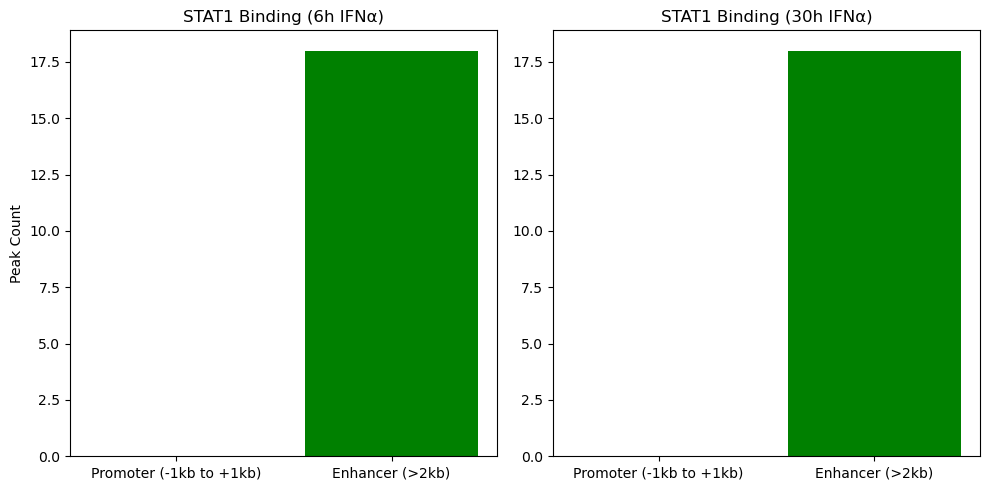

In [116]:
import matplotlib.pyplot as plt

# Count occurrences
counts_6h = [len(promoter_6h), len(enhancer_6h)]
counts_30h = [len(promoter_30h), len(enhancer_30h)]
categories = ["Promoter (-1kb to +1kb)", "Enhancer (>2kb)"]

# Plot
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].bar(categories, counts_6h, color=["blue", "green"])
ax[0].set_title("STAT1 Binding (6h IFNα)")
ax[0].set_ylabel("Peak Count")

ax[1].bar(categories, counts_30h, color=["blue", "green"])
ax[1].set_title("STAT1 Binding (30h IFNα)")

plt.tight_layout()
plt.show()

#### Step 11.2 Classify peaks into enhancer-associated and promoter-asscoiated (2.Annotation based classification (based on categorical annotation labels))

In [123]:
import pandas as pd
import os

# Define input annotation files (generated from HOMER annotatePeaks.pl)
annotation_file_6h = os.path.join(output_dir, "8_peak_annotation", "annotated_IFNa6h.txt")
annotation_file_30h = os.path.join(output_dir, "8_peak_annotation", "annotated_IFNa30h.txt")

# Define output BED files for enhancer-associated peaks
enhancer_bed_6h = os.path.join(output_dir, "4_peak_calling", "output", "differential_binding", "enhancer_IFNa6h.bed")
enhancer_bed_30h = os.path.join(output_dir, "4_peak_calling", "output", "differential_binding", "enhancer_IFNa30h.bed")

# Load annotation data
df_6h = pd.read_csv(annotation_file_6h, sep="\t", comment = "#", header = 0, index_col = False)
df_30h = pd.read_csv(annotation_file_30h, sep="\t", comment = "#", header = 0, index_col = False)

# Manually rename columns (Ensure these match the actual column names)
df_6h.columns = [
    "PeakID", "Chr", "Start", "End", "Strand", "Peak_Score", "Focus_Ratio", 
    "Annotation", "Detailed_Annotation", "Distance_to_TSS", "Nearest_PromoterID", 
    "Entrez_ID", "Nearest_Unigene", "Nearest_Refseq", "Nearest_Ensembl",
    "Gene_Name", "Gene_Alias", "Gene_Description", "Gene_Type"
]

df_30h.columns = df_6h.columns  # Apply same column structure

# Define enhancer-like regions (Intergenic & Intronic regions)
enhancer_regions = ["Intergenic", "Intron", "Distal Intergenic"]

# Filter enhancer-associated peaks
df_enhancer_6h = df_6h[df_6h["Annotation"].isin(enhancer_regions)]
df_enhancer_30h = df_30h[df_30h["Annotation"].isin(enhancer_regions)]

# Select only BED format columns: Chromosome, Start, End, Name, Score, Strand
df_enhancer_6h = df_enhancer_6h[["Chr", "Start", "End", "PeakID", "Peak_Score", "Strand"]]
df_enhancer_30h = df_enhancer_30h[["Chr", "Start", "End", "PeakID", "Peak_Score", "Strand"]]

# Save as BED files (without headers)
df_enhancer_6h.to_csv(enhancer_bed_6h, sep="\t", index=False, header=False)
df_enhancer_30h.to_csv(enhancer_bed_30h, sep="\t", index=False, header=False)

print("Enhancer-associated peaks extracted successfully!")

Enhancer-associated peaks extracted successfully!


#### Step 11.3 Run HOMER for TF Enrichment on enhancer peaks

In [125]:
import os
import subprocess

# Define genome
genome = "hg38"

# Define HOMER output directories
homer_output_dir = os.path.join(output_dir, "7_motif_analysis")
homer_enhancer_6h_out = os.path.join(homer_output_dir, "enhancer_IFNa6h_motif")
homer_enhancer_30h_out = os.path.join(homer_output_dir, "enhancer_IFNa30h_motif")

# Ensure output directories exist
os.makedirs(homer_enhancer_6h_out, exist_ok=True)
os.makedirs(homer_enhancer_30h_out, exist_ok=True)

# Define background files
background_6h = os.path.join(homer_output_dir, "background_IFNa6h.bed")
background_30h = os.path.join(homer_output_dir, "background_IFNa30h.bed")

def run_homer_motif(peak_file, background_file, output_dir):
    """Run HOMER findMotifsGenome.pl with background correction to identify enriched motifs in enhancer regions."""
    
    command = [
        "findMotifsGenome.pl", peak_file, genome, output_dir,
        "-size", "200", "-len", "8,10,12,15", "-mis", "1", "-p", "4",
        "-bg", background_file
    ]
    
    print(f"Running HOMER motif analysis for enhancers in {peak_file} with background {background_file}...")
    subprocess.run(command, check=True)
    print(f"Motif results saved in {output_dir}")

# Run HOMER for enhancer-associated peaks
run_homer_motif(enhancer_bed_6h, background_6h, homer_enhancer_6h_out)
run_homer_motif(enhancer_bed_30h, background_30h, homer_enhancer_30h_out)

print("HOMER motif enrichment analysis for enhancers completed with background correction!")

Running HOMER motif analysis for enhancers in /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/enhancer_IFNa6h.bed with background /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/background_IFNa6h.bed...



	Position file = /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/enhancer_IFNa6h.bed
	Genome = hg38
	Output Directory = /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/enhancer_IFNa6h_motif
	Fragment size set to 200
	Motif length set at 8,10,12,15,*** might want to hit ctrl+C to quit if it takes too long!
*** If you run out of memmory try reducing the number background sequences

	Will search for strings with 1 mismatches
	Using 4 CPUs
	background position file: /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/background_IFNa6h.bed
	Found mset for "human", will check against vertebrates motifs
	Peak/BED file conversion summary:
		BED/Header formatted lines: 18
		peakfile formatted lines: 0

	Peak File Statistics:
		Total Peaks: 18
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1

Motif results saved in /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/enhancer_IFNa6h_motif
Running HOMER motif analysis for enhancers in /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/enhancer_IFNa30h.bed with background /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/background_IFNa30h.bed...


	Extracting 6 sequences from chr10
	Extracting 11 sequences from chr11
	Extracting 4 sequences from chr12
	Extracting 8 sequences from chr13
	Extracting 5 sequences from chr14
	Extracting 7 sequences from chr15
	Extracting 5 sequences from chr16
	Extracting 5 sequences from chr17
	Extracting 11 sequences from chr18
	Extracting 5 sequences from chr19
	Extracting 22 sequences from chr2
	Extracting 3 sequences from chr20
	Extracting 5 sequences from chr21
	Extracting 4 sequences from chr22
	Extracting 19 sequences from chr3
	Extracting 10 sequences from chr4
	Extracting 15 sequences from chr5
	Extracting 11 sequences from chr6
	Extracting 15 sequences from chr7
	Extracting 9 sequences from chr8
	Extracting 9 sequences from chr9
	Extracting 15 sequences from chrX
	Extracting 6 sequences from chrY
		13 of 226 removed because they had >70.00% Ns (i.e. masked repeats)

	Not removing redundant sequences


	Sequences processed:
		Auto detected maximum sequence length of 201 bp
		213 total

	Fre

Motif results saved in /home/abhi39/Projects/CHIPseq/output/7_motif_analysis/enhancer_IFNa30h_motif
HOMER motif enrichment analysis for enhancers completed with background correction!


	Formatting HTML page...
		1 of 19 (1e-18) similar to PB0105.1_Arid3a_2/Jaspar(0.564)
		2 of 19 (1e-13) similar to PB0121.1_Foxj3_2/Jaspar(0.655)
		3 of 19 (1e-13) similar to Nfat5/MA0606.3/Jaspar(0.645)
		4 of 19 (1e-11) similar to PH0016.1_Cux1_1/Jaspar(0.699)
		5 of 19 (1e-11) similar to PB0156.1_Plagl1_2/Jaspar(0.621)
		6 of 19 (1e-11) similar to POL010.1_DCE_S_III/Jaspar(0.598)
		7 of 19 (1e-9) similar to EKLF(Zf)/Erythrocyte-Klf1-ChIP-Seq(GSE20478)/Homer(0.637)
		8 of 19 (1e-9) similar to Hmga1/MA2124.1/Jaspar(0.785)
		9 of 19 (1e-8) similar to Prdm14/MA1998.2/Jaspar(0.750)
		10 of 19 (1e-8) similar to MEF2C/MA0497.2/Jaspar(0.687)
		11 of 19 (1e-8) similar to PH0073.1_Hoxc9/Jaspar(0.732)
		12 of 19 (1e-8) similar to PSE(SNAPc)/K562-mStart-Seq/Homer(0.699)
		13 of 19 (1e-8) similar to Six3/MA0631.2/Jaspar(0.821)
		14 of 19 (1e-6) similar to POL008.1_DCE_S_I/Jaspar(0.657)
		15 of 19 (1e-6) similar to Pax7/MA0680.3/Jaspar(0.807)
		16 of 19 (1e-5) similar to RBPJ/MA1116.2/Jaspar(0.71

#### Step 11.4: Extract genes near enhancer-associated peaks
* After identifying enhancer-associated peaks, we need to extract the genes near these peaks using HOMER's annotatePeaks.pl

In [126]:
import os
import subprocess

# Define genome
genome = "hg38"

# Define directories
output_dir = "/home/abhi39/Projects/CHIPseq/output"
homer_annotation_dir = os.path.join(output_dir, "8_peak_annotation")

# Ensure annotation directory exists
os.makedirs(homer_annotation_dir, exist_ok=True)

# Define input BED files for enhancer peaks
enhancer_bed_6h = os.path.join(output_dir, "4_peak_calling", "output", "differential_binding", "enhancer_IFNa6h.bed")
enhancer_bed_30h = os.path.join(output_dir, "4_peak_calling", "output", "differential_binding", "enhancer_IFNa30h.bed")

# Define output annotation files
annotated_enhancer_6h = os.path.join(homer_annotation_dir, "annotated_enhancer_IFNa6h.txt")
annotated_enhancer_30h = os.path.join(homer_annotation_dir, "annotated_enhancer_IFNa30h.txt")

def annotate_enhancer_peaks(peak_file, output_file):
    """Run HOMER annotatePeaks.pl to find genes near enhancer peaks."""
    
    command = f"annotatePeaks.pl {peak_file} {genome} -annStats {output_file.replace('.txt', '_stats.txt')} > {output_file}"
    
    print(f"Annotating enhancer peaks in {peak_file}...")
    subprocess.run(command, shell=True, check=True)
    print(f"Annotation results saved in {output_file}")

# Run annotation for enhancer-associated peaks
annotate_enhancer_peaks(enhancer_bed_6h, annotated_enhancer_6h)
annotate_enhancer_peaks(enhancer_bed_30h, annotated_enhancer_30h)

print("Enhancer annotation completed. Now extracting gene lists...")

Annotating enhancer peaks in /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/enhancer_IFNa6h.bed...



	Peak file = /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/enhancer_IFNa6h.bed
	Genome = hg38
	Organism = human
	Peak/BED file conversion summary:
		BED/Header formatted lines: 18
		peakfile formatted lines: 0
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 18
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	-----------------------
	offset=0
	Finding Closest TSS...
	Annotating:...........
		Annotation	Number of peaks	Total size (bp)	Log2 Ratio (obs/exp)	LogP enrichment (+values depleted)
		3UTR	0.0	13678567	-0.226	0.168
		miRNA	0.0	46566	-0.001	0.001
		ncRNA	0.0	3636235	-0.063	0.045
		TTS	0.0	16004856	-0.261	0.197
		pseudo	0.0	1044497	-0.018	0.013
		Exon	0.0	18149263	-0.293	0.224
		Intron	0.0	627804747	-3.852	10.040
		Inter

Annotation results saved in /home/abhi39/Projects/CHIPseq/output/8_peak_annotation/annotated_enhancer_IFNa6h.txt
Annotating enhancer peaks in /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/enhancer_IFNa30h.bed...



	Peak file = /home/abhi39/Projects/CHIPseq/output/4_peak_calling/output/differential_binding/enhancer_IFNa30h.bed
	Genome = hg38
	Organism = human
	Peak/BED file conversion summary:
		BED/Header formatted lines: 18
		peakfile formatted lines: 0
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 18
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	-----------------------
	offset=0
	Finding Closest TSS...
	Annotating:.............
		Annotation	Number of peaks	Total size (bp)	Log2 Ratio (obs/exp)	LogP enrichment (+values depleted)
		3UTR	0.0	13501771	-0.203	0.151
		miRNA	0.0	62988	-0.001	0.001
		ncRNA	0.0	3541878	-0.056	0.039
		TTS	0.0	16644907	-0.247	0.186
		pseudo	0.0	1075237	-0.017	0.012
		Exon	0.0	19418800	-0.285	0.217
		Intron	0.0	637298138	-3.666	9.012
		Int

Annotation results saved in /home/abhi39/Projects/CHIPseq/output/8_peak_annotation/annotated_enhancer_IFNa30h.txt
Enhancer annotation completed. Now extracting gene lists...


#### Step 11.5: Run (ChIP-X Enrichment Analysis 3) ChEA3 for TF enrichment analysis
* helps identify which TFs regulate genes near enhancer-bound peaks

Here we will
* Extract gene list from the annotated enhancer peaks
* Submit them to ChEA3 API for TF enrichment analysis
* Save the results for further analysis


In [130]:
import os
import pandas as pd
import requests
import json

# Define file paths
annotated_enhancer_6h = os.path.join(homer_annotation_dir, "annotated_enhancer_IFNa6h.txt")
annotated_enhancer_30h = os.path.join(homer_annotation_dir, "annotated_enhancer_IFNa30h.txt")

# Extract gene lists
def extract_genes(annotation_file):
    """Extracts gene names from annotated enhancer peaks."""
    df = pd.read_csv(annotation_file, sep="\t", comment="#", header=0)
    
    # Ensure correct column name
    if "Gene Name" not in df.columns:
        raise ValueError(f"Error: 'Gene Name' column not found in {annotation_file}")
    
    # Drop NaN values and extract gene names
    genes = df["Gene Name"].dropna().unique().tolist()
    
    return genes

# Get gene lists from enhancer-associated peaks
genes_6h = extract_genes(annotated_enhancer_6h)
genes_30h = extract_genes(annotated_enhancer_30h)

# Function to query ChEA3 API
def run_chea3(gene_list, condition):
    """Run ChEA3 TF enrichment using the ChEA3 API."""
    url = "https://maayanlab.cloud/chea3/api/enrich/"
    
    # Prepare payload
    payload = {
        "gene_set": gene_list,
        "background": "GENCODE",
        "query_name": condition,
        "libraries": ["ChEA", "ReMap", "ENCODE", "GTEx"]
    }
    
    print(f"Running ChEA3 TF enrichment for {condition}...")
    response = requests.post(url, json=payload)
    
    if response.status_code == 200:
        results = response.json()
        print(json.dumps(results, indent=4))  # Debugging: Print the response
        return results
    else:
        print(f"Error in ChEA3 request for {condition}: {response.status_code}")
        return None

# Run ChEA3 analysis for both conditions
chea3_results_6h = run_chea3(genes_6h, "IFNa6h_enhancer_genes")
chea3_results_30h = run_chea3(genes_30h, "IFNa30h_enhancer_genes")

# Save results to CSV
def save_chea3_results(chea3_results, output_file):
    """Save ChEA3 TF enrichment results to a CSV file."""
    if chea3_results:
        # Identify the correct key
        key = "Integrated--meanRank"  # This is the correct key from your API response
        
        if key in chea3_results:
            df = pd.DataFrame(chea3_results[key])  # Convert to DataFrame
            df.to_csv(output_file, index=False)  # Save results
            print(f"ChEA3 results saved: {output_file}")
        else:
            print(f"Warning: ChEA3 did not return expected results for {output_file}")
    else:
        print(f"Skipping {output_file} as no valid results were obtained.")

# Save ChEA3 results
save_chea3_results(chea3_results_6h, os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa6h.csv"))
save_chea3_results(chea3_results_30h, os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa30h.csv"))

print("ChEA3 TF enrichment analysis completed!")

Running ChEA3 TF enrichment for IFNa6h_enhancer_genes...
{
    "Integrated--meanRank": [
        {
            "Query Name": "IFNa6h_enhancer_genes",
            "Rank": "1",
            "TF": "NFX1",
            "Score": "69.67",
            "Library": "ARCHS4 Coexpression,31;Enrichr Queries,99;GTEx Coexpression,79",
            "Overlapping_Genes": "PGBD2,PRMT2"
        },
        {
            "Query Name": "IFNa6h_enhancer_genes",
            "Rank": "2",
            "TF": "ZSCAN5B",
            "Score": "93.33",
            "Library": "ARCHS4 Coexpression,42;Enrichr Queries,144;GTEx Coexpression,94",
            "Overlapping_Genes": "ANHX,FRG2B"
        },
        {
            "Query Name": "IFNa6h_enhancer_genes",
            "Rank": "3",
            "TF": "ZNF778",
            "Score": "93.67",
            "Library": "ARCHS4 Coexpression,12;Enrichr Queries,136;GTEx Coexpression,133",
            "Overlapping_Genes": "RPL23AP87"
        },
        {
            "Query Name": "IF

#### Step 11.6: Visualizing TF Enrichment results
* Generate bar plots to visualize top enriched TFs in 6h vs 30h conditions

/tmp/ipykernel_537640/1337472579.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_6h_top["Condition"] = "6h"
/tmp/ipykernel_537640/1337472579.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_30h_top["Condition"] = "30h"


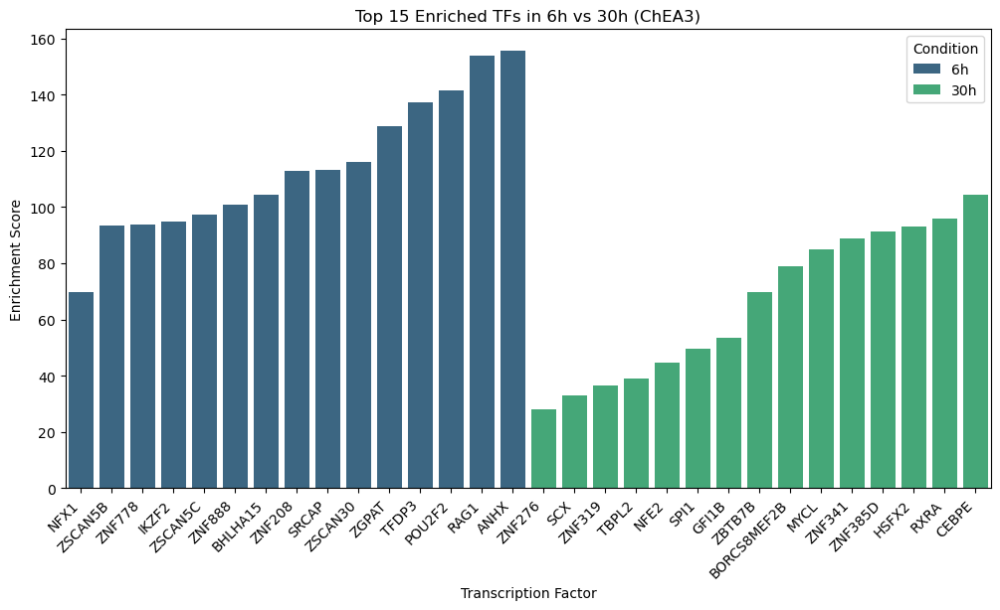

In [131]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Define file paths
chea3_6h_file = os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa6h.csv")
chea3_30h_file = os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa30h.csv")

# Load ChEA3 results
df_6h = pd.read_csv(chea3_6h_file)
df_30h = pd.read_csv(chea3_30h_file)

# Select only the top 15 TFs based on Rank for each condition
df_6h_top = df_6h.head(15)
df_30h_top = df_30h.head(15)

# Create a combined DataFrame for plotting
df_6h_top["Condition"] = "6h"
df_30h_top["Condition"] = "30h"
df_combined = pd.concat([df_6h_top, df_30h_top])

# Plot bar chart for top enriched TFs
plt.figure(figsize=(12, 6))
sns.barplot(data=df_combined, x="TF", y="Score", hue="Condition", palette="viridis")
plt.xticks(rotation=45, ha="right")
plt.xlabel("Transcription Factor")
plt.ylabel("Enrichment Score")
plt.title("Top 15 Enriched TFs in 6h vs 30h (ChEA3)")
plt.legend(title="Condition")
plt.show()


##### Potential Biological Interpreation
1. Early time point(6h) -> Rapid activation of immune response genes and chromatin remodeling factors
2. Late timepont(30h) -> Sustained regulation of gene expression with involvement of factors like CEBPE and SPT16 which are linked to long term immune modulation and differentiation.

* Distinct transciption profiles at 6h vs 30h: Dynamic changes in transcriptional regulation over time
* Strong STAT1-associated TFs in 6h: Several ZNF-family TFs (ZSCAN5, ZNF778, ZNF468, ZNF385) are highly enriched at 6h.
* POU2F2 and POLR3G are also significantly enriched, which are known regulators in immune response pathways.
* At 30h, the enriched TFs shift towards factors like NFYC2, SPT16, and CEBPE, which suggests a change in transcriptional programs.
* Many ZNF (Zinc Finger) TFs are highly enriched at 6h, which might indicate a role in early chromatin remodeling or enhancer activation.
* ZBTB26, TBPL2, NFYC2 are more prominent at 30h, showing a shift from immediate early-response factors to sustained transcriptional regulation.

##### Step 11.7: Compare Enriched TFs to known STAT1 target genes
To determine if the enriched TFs from ChEA3 are known STAT1 target genes, we can:

* Retrieve known STAT1 targets from databases (e.g., ChEA3, TRRUST, JASPAR, or Harmonizome).
* Compare these known targets with the TFs enriched at 6h and 30h.


In [136]:
import pandas as pd
import requests
import json

# Function to query ChEA3 API for STAT1 targets
def get_stat1_targets_from_chea3():
    """Fetches STAT1 target genes from ChEA3."""
    url = "https://maayanlab.cloud/chea3/api/enrich/"
    
    # Query STAT1 as the input gene set
    payload = {
        "gene_set": ["STAT1"],
        "background": "GENCODE",
        "query_name": "STAT1_Targets",
        "libraries": ["ChEA"]  # Focus on ChEA library
    }
    
    print("Fetching STAT1 targets from ChEA3...")
    response = requests.post(url, json=payload)
    
    if response.status_code == 200:
        results = response.json()
        
        # Print response structure for debugging
        print(json.dumps(results, indent=4)) 
        
        # Identify the correct key dynamically
        key = next((k for k in results.keys() if "Integrated" in k or "ChEA" in k), None)
        
        if key and key in results:
            stat1_targets = [entry["TF"] for entry in results[key]]
            return set(stat1_targets)
        else:
            print("No valid results for STAT1 in ChEA3 response.")
            return set()
    else:
        print(f"Error retrieving STAT1 targets: {response.status_code}")
        return set()

# Retrieve STAT1 target genes
stat1_targets = get_stat1_targets_from_chea3()

# Load enriched TFs from ChEA3 analysis
chea3_tfs_6h = pd.read_csv(os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa6h.csv"))
chea3_tfs_30h = pd.read_csv(os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa30h.csv"))

# Check if enriched TFs are known STAT1 targets
chea3_tfs_6h["Is_STAT1_Target"] = chea3_tfs_6h["TF"].isin(stat1_targets)
chea3_tfs_30h["Is_STAT1_Target"] = chea3_tfs_30h["TF"].isin(stat1_targets)

# Save updated results
chea3_tfs_6h.to_csv(os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa6h_STAT1_targets.csv"), index=False)
chea3_tfs_30h.to_csv(os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa30h_STAT1_targets.csv"), index=False)

print("STAT1 target gene comparison completed!")

Fetching STAT1 targets from ChEA3...
{
    "Integrated--meanRank": [
        {
            "Query Name": "STAT1_Targets",
            "Rank": "1",
            "TF": "NCOA3",
            "Score": "62.0",
            "Library": "ARCHS4 Coexpression,8;Enrichr Queries,64;ReMap ChIP-seq,156;GTEx Coexpression,20",
            "Overlapping_Genes": "STAT1"
        },
        {
            "Query Name": "STAT1_Targets",
            "Rank": "2",
            "TF": "ZNF267",
            "Score": "69.33",
            "Library": "ARCHS4 Coexpression,10;Enrichr Queries,118;GTEx Coexpression,80",
            "Overlapping_Genes": "STAT1"
        },
        {
            "Query Name": "STAT1_Targets",
            "Rank": "3",
            "TF": "SP110",
            "Score": "90.33",
            "Library": "ARCHS4 Coexpression,5;Enrichr Queries,14;GTEx Coexpression,252",
            "Overlapping_Genes": "STAT1"
        },
        {
            "Query Name": "STAT1_Targets",
            "Rank": "4",
      

#### Step 12: Validate and refine TF enrichment analysis results
* Since we observed enriched TFs in enhancer-associated peaks, its crucial to validate and interpret how these TFs are connected with regulatory network

1. Access overlap of enriched TFs (ChEA3) and motifs (HOMER):
* Generate Venn diagram to check which TFs are enriched in both analyses.
* Investgate unique TFs in each analysis

2. Compare with known regulatory interactions:
* Use Encode ChIP-seq datasets to confirm if the TFs enriched in your dataset are known regulators in biologicval context. 

##### Step 12.1: Overlay enriched TFs with motif analysis (Homer results)
* The goal is to check if the enriched TFs identified from ChEA3 also have enriched binding motifs in STAT1-bound enhancers.
* We will extract TF motifs from HOMER motif analysis (knownResults.txt) and compare them to ChEA3 TFs


In [182]:
# Compare TF motifs from HOMER with ChEA3 enriched TFs

import os
import pandas as pd
import re
from fuzzywuzzy import process

# Define file paths
homer_motif_file_6h = os.path.join(homer_output_dir, "enhancer_IFNa6h_motif", "knownResults.txt")
homer_motif_file_30h = os.path.join(homer_output_dir, "enhancer_IFNa30h_motif", "knownResults.txt")
chea3_6h_file = os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa6h_STAT1_targets.csv")
chea3_30h_file = os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa6h_STAT1_targets.csv")

# Define function to extract TFs from HOMER motif analysis
def extract_homer_tfs(homer_file):
    """Extract TF names from HOMER knownResults.txt, handling different formats."""
    df = pd.read_csv(homer_file, sep="\t", skiprows=1)
    df.columns = ["Motif_Name", "Consensus_Sequence", "P-value", "Log_P-value", "q-value",
                  "Target_Sequences", "Target_Percentage", "Background_Sequences", "Background_Percentage"]
    
    # Extract TF name before '(' or '/'
    df["TF_Parsed"] = df["Motif_Name"].apply(lambda x: re.split(r"[\(/]", x)[0].strip().upper())

    # Get unique TFs
    return set(df["TF_Parsed"].unique())

# Extract TFs from motif analysis
homer_tfs_6h = extract_homer_tfs(homer_motif_file_6h)
homer_tfs_30h = extract_homer_tfs(homer_motif_file_30h)

print(f"Extracted {len(homer_tfs_6h)} TFs from HOMER (6h).")
print(f"Extracted {len(homer_tfs_30h)} TFs from HOMER (30h).")

### Step 2: Load and Standardize ChEA3 TF Names
def load_and_standardize_chea3(chea3_file):
    """Load ChEA3 data and convert TF names to uppercase."""
    df = pd.read_csv(chea3_file)
    df["TF"] = df["TF"].str.upper()  # Standardize TF names
    return df

chea3_tfs_6h = load_and_standardize_chea3(chea3_6h_file)
chea3_tfs_30h = load_and_standardize_chea3(chea3_30h_file)

### Step 3: Apply Fuzzy Matching for TF Names
def fuzzy_match_tf(homer_tfs, chea3_tfs, threshold=91):
    """Match HOMER TFs to ChEA3 TFs using fuzzy matching."""
    matched_tfs = {}
    for tf in chea3_tfs:
        match, score = process.extractOne(tf, list(homer_tfs))
        if score >= threshold:
            matched_tfs[tf] = match
    return matched_tfs

# Perform fuzzy matching
matched_6h = fuzzy_match_tf(homer_tfs_6h, set(chea3_tfs_6h["TF"]))
matched_30h = fuzzy_match_tf(homer_tfs_30h, set(chea3_tfs_30h["TF"]))

# Convert to sets
matched_tfs_6h = set(matched_6h.keys())
matched_tfs_30h = set(matched_30h.keys())

# Update DataFrame with matched TFs
chea3_tfs_6h["In_HOMER"] = chea3_tfs_6h["TF"].isin(matched_tfs_6h)
chea3_tfs_30h["In_HOMER"] = chea3_tfs_30h["TF"].isin(matched_tfs_30h)

### Step 4: Save Processed ChEA3 TFs
chea3_tfs_6h.to_csv(os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa6h_merged.csv"), index=False)
chea3_tfs_30h.to_csv(os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa30h_merged.csv"), index=False)

print("TF motif overlay with HOMER results completed!")
print(f"Matched {len(matched_tfs_6h)} TFs (6h) and {len(matched_tfs_30h)} TFs (30h).")


Extracted 448 TFs from HOMER (6h).
Extracted 448 TFs from HOMER (30h).
TF motif overlay with HOMER results completed!
Matched 368 TFs (6h) and 369 TFs (30h).


##### Step 12.2: Search for partial matches using fuzzywuzzy

In [196]:
from fuzzywuzzy import process

# Define the TF you want to search
tf_to_search = "ZNF317"

# Perform fuzzy matching
best_match, similarity_score = process.extractOne(tf_to_search, list(homer_tfs_6h))

# Print the results
if similarity_score >= 85:  # Set a threshold for acceptable match
    print(f"Closest match for '{tf_to_search}' in HOMER motifs (6h): {best_match} (Score: {similarity_score})")
else:
    print(f"No good match found for '{tf_to_search}' in HOMER motifs (6h). Best match: {best_match} (Score: {similarity_score})")

Closest match for 'ZNF317' in HOMER motifs (6h): ZNF317 (Score: 100)


##### Interpretation
1. Analysis reveals key TFs enriched in both enhancer dataset
2. Many TFs enriched in ChEA3 do not have corresponding motifs enriched in HOMER.
3. This suggests that enhancer regulation may be influenced by TF co-binding, chromatin accessibility, or post-translational modifications rather than direct motif-driven binding.


#### Step 12.3: Overlap of Transcription factors identified using two different approaches
* ChEA3 Enriched TFs (Left Circle): TFs identified through ChEA3 enrichment analysis, which predicts TF binding based on existing ChIP-seq datasets and co-expression data.
* HOMER Motifs (Right Circle): TFs identified through HOMER motif analysis, which detects binding motifs in enhancer-associated peaks.

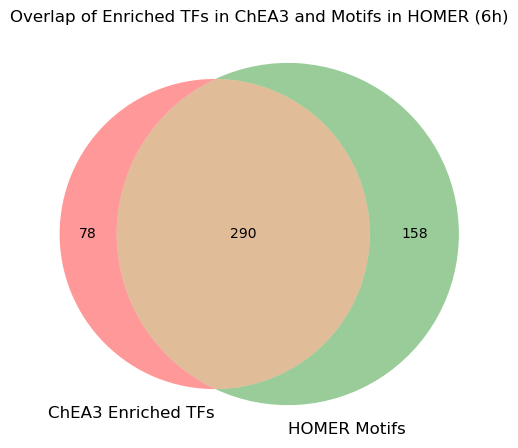

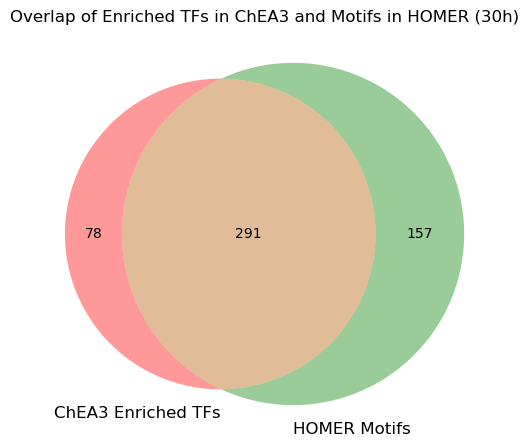

In [183]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2


# Load processed ChEA3 results
chea3_tfs_6h = pd.read_csv(os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa6h_merged.csv"))
chea3_tfs_30h = pd.read_csv(os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa30h_merged.csv"))

# Extract enriched TFs from ChEA3 results
tf_enriched_chea3_6h = set(chea3_tfs_6h.loc[chea3_tfs_6h["In_HOMER"], "TF"])
tf_enriched_chea3_30h = set(chea3_tfs_30h.loc[chea3_tfs_30h["In_HOMER"], "TF"])

# Extract TFs from HOMER motif results
homer_tfs_6h = extract_homer_tfs(homer_motif_file_6h)
homer_tfs_30h = extract_homer_tfs(homer_motif_file_30h)

# Venn Diagram (Overlap of TFs in ChEA3 and HOMER)
plt.figure(figsize=(6,6))
venn2([tf_enriched_chea3_6h, homer_tfs_6h], ('ChEA3 Enriched TFs', 'HOMER Motifs'))
plt.title("Overlap of Enriched TFs in ChEA3 and Motifs in HOMER (6h)")
plt.show()

plt.figure(figsize=(6,6))
venn2([tf_enriched_chea3_30h, homer_tfs_30h], ('ChEA3 Enriched TFs', 'HOMER Motifs'))
plt.title("Overlap of Enriched TFs in ChEA3 and Motifs in HOMER (30h)")
plt.show()

##### Interpretation
1. Analysis reveals key TFs enriched in both enhancer dataset
2. Many TFs enriched in ChEA3 do not have corresponding motifs enriched in HOMER.
3. This suggests that enhancer regulation may be influenced by TF co-binding, chromatin accessibility, or post-translational modifications rather than direct motif-driven binding.


##### Step 12.4: Build TF-TF regulatory network based on known interactions

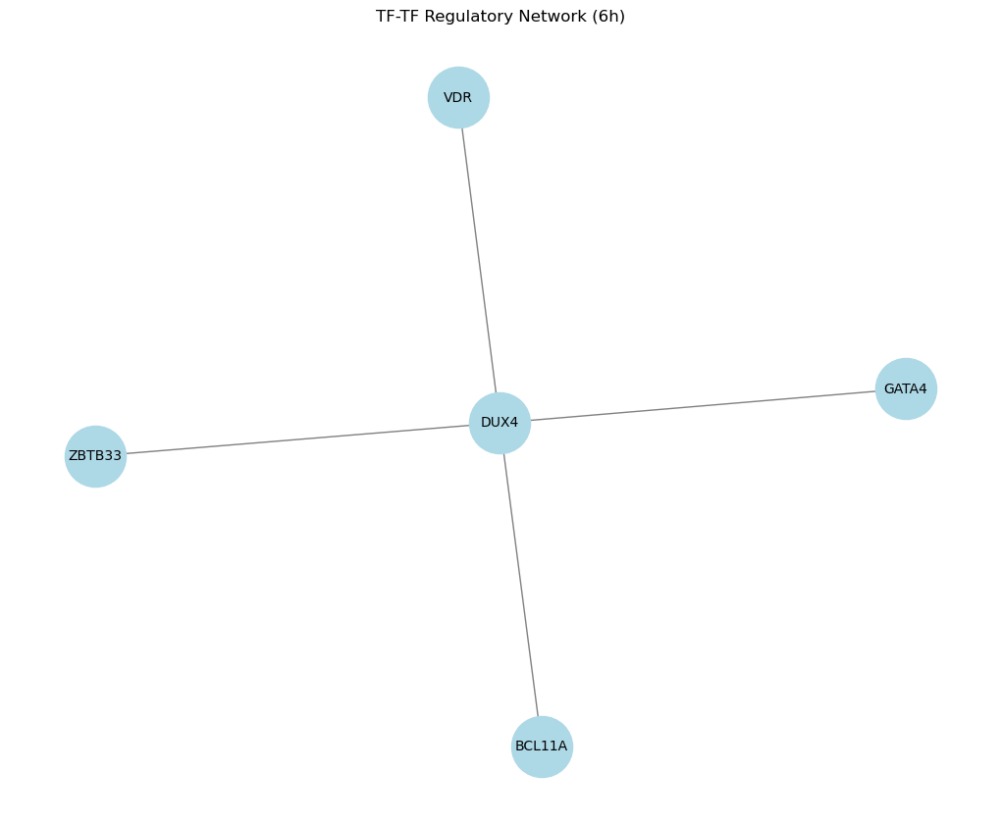

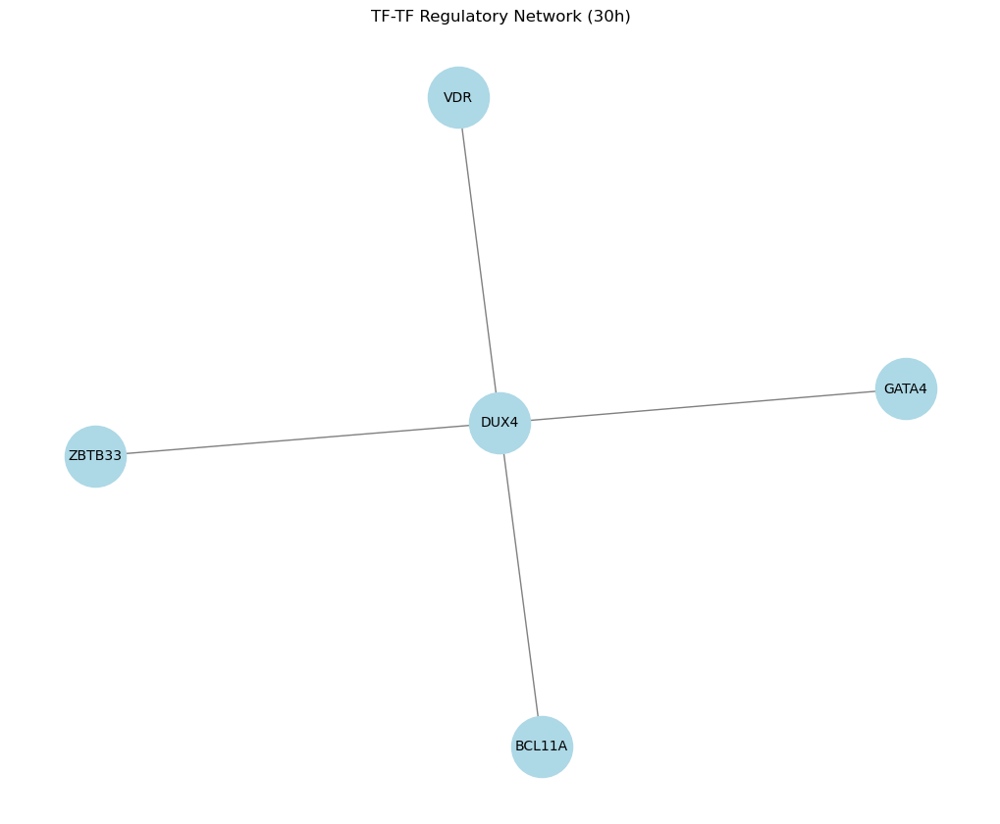

In [198]:
# Build TF-TF regulatory network based on known interactions
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx

# Load known TF interactions from ChEA3 data
def load_tf_interactions(chea3_file):
    """Load TF-TF interactions from ChEA3 data."""
    df = pd.read_csv(chea3_file)
    
    # Ensure TF names are standardized
    df["TF"] = df["TF"].str.upper()
    
    # Extract Overlapping Genes (potential targets/regulators)
    df["Overlapping_Genes"] = df["Overlapping_Genes"].fillna("").str.upper().str.split(",")
    
    # Create edges from TF to their known targets
    edges = []
    for _, row in df.iterrows():
        tf = row["TF"]
        targets = row["Overlapping_Genes"]
        for target in targets:
            if target:  # Ensure target is valid
                edges.append((tf, target))
    
    return edges

# Load known TF interactions for 6h and 30h
edges_6h = load_tf_interactions(os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa6h_merged.csv"))
edges_30h = load_tf_interactions(os.path.join(homer_annotation_dir, "ChEA3_TF_IFNa30h_merged.csv"))

# Filter edges to keep only interactions where both TFs are in HOMER and ChEA3 results
filtered_edges_6h = [(tf1, tf2) for tf1, tf2 in edges_6h if tf1 in homer_tfs_6h and tf2 in homer_tfs_6h]
filtered_edges_30h = [(tf1, tf2) for tf1, tf2 in edges_30h if tf1 in homer_tfs_30h and tf2 in homer_tfs_30h]

# Create and draw networks
def plot_tf_network(edges, title):
    """Plot TF-TF regulatory network."""
    G = nx.Graph()
    G.add_edges_from(edges)

    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(G, seed=42)
    nx.draw(G, pos, with_labels=True, node_color="lightblue", edge_color="gray", node_size=2000, font_size=10)
    plt.title(title)
    plt.show()

# Plot the filtered TF networks
plot_tf_network(filtered_edges_6h, "TF-TF Regulatory Network (6h)")
plot_tf_network(filtered_edges_30h, "TF-TF Regulatory Network (30h)")

1. Central role of DUX4: DUX4 appears to be the central hub in both networks, meaning it is likely an important regulator at both time points. This suggests that DUX4 may play a sustained role in TF-TF interactions, irrespective of time.
2. Consistent TF Interactions: The same five TFs (VDR, BCL11A, GATA4, ZBTB33, and DUX4) appear in both networks. This indicates that there is no major shift in the regulatory network composition between 6h and 30h. The interactions between these TFs are stable over time.
3. Potential TF Regulatory mechanisms: Since these networks were built based on known TF interactions, these figures suggest that DUX4 may co-regulate or interact with VDR, BCL11A, GATA4, and ZBTB33.



#### Step 13: Pathway Analysis: GO/KEGG Enrichment

##### Step 13.1: Extract genes near enhancer-associated peaks

In [199]:
# 13.1 Extract genes near enhancer-associated peaks
import pandas as pd

# Load annotated enhancer peaks file
enhancer_peaks_6h_file = os.path.join(homer_annotation_dir,"annotated_enhancer_IFNa6h.txt")
enhancer_peaks_30h_file = os.path.join(homer_annotation_dir,"annotated_enhancer_IFNa30h.txt")

# Read the file
df_6h = pd.read_csv(enhancer_peaks_6h_file, sep="\t")
df_30h = pd.read_csv(enhancer_peaks_30h_file, sep="\t")

# Extract unique gene names near enhancer-associated peaks
genes_6h = df_6h["Gene Name"].dropna().unique().tolist()
genes_30h = df_30h["Gene Name"].dropna().unique().tolist()

# Save gene lists to files
with open("enhancer_genes_6h.txt", "w") as f:
    f.write("\n".join(genes_6h))

with open("enhancer_genes_30h.txt", "w") as f:
    f.write("\n".join(genes_30h))

print(f"Extracted {len(genes_6h)} genes for 6h and {len(genes_30h)} genes for 30h.")

Extracted 11 genes for 6h and 12 genes for 30h.


##### Step 13.2: Perform KEGG and GO enrichment analysis

In [203]:
# 13.2 Perform KEGG and GO Enrichment Analysis
import gprofiler
import pandas as pd

go_kegg_dir = os.path.join(output_dir, "9_GO_KEGG")
os.makedirs(go_kegg_dir, exist_ok = True)

# Load extracted gene lists
gene_list_6h = pd.read_csv("enhancer_genes_6h.txt", header=None)[0].tolist()
gene_list_30h = pd.read_csv("enhancer_genes_30h.txt", header=None)[0].tolist()

# Initialize gProfiler API
gp = gprofiler.GProfiler(return_dataframe=True)

# Perform GO and KEGG enrichment for 6h and 30h
results_6h = gp.profile(organism="hsapiens", query=gene_list_6h, sources=["GO:BP", "KEGG"])
results_30h = gp.profile(organism="hsapiens", query=gene_list_30h, sources=["GO:BP", "KEGG"])

# Save results
results_6h.to_csv("output/9_GO_KEGG/GO_KEGG_enrichment_6h.csv", index=False)
results_30h.to_csv("output/9_GO_KEGG/GO_KEGG_enrichment_30h.csv", index=False)

print("GO and KEGG enrichment analysis completed!")

GO and KEGG enrichment analysis completed!


* No enrichment

################################ Delete below ########################